<div class="alert alert-info"> <b>🎓 Комментарий студента:</b> Привет! Результаты обучения моделей получились как-то так себе, поэтому надеюсь получить рекомендации, как можно существенно улучшить текущий результат. Дополнительно ниже по тексту будет несколько вопросов по постановке задачи.</div>

# Поиск изображений по запросу (Proof of Concept)

## Введение

### Описание и цель проекта
Цель проекта - реализовать демонстрацинную версию поиска изображения по запросу. Для этого должна быть разработана модель, которая на основе векторного представления изображения и текста вернет число от 0 до 1, отражающее насколько изображение и текст соответствуют друг другу.

### Дополнительные требования к проекту
1. Модели обязательные для исследования в рамках проекта:
    * Линейная регрессия
    * Полносвязная нейронная сеть 
2. Юридическое ограничение:
    * При попытке посмотреть изображение ребенка до 16 лет должен выводиться дисклеймер:
      > This image is unavailable in your country in compliance with local laws.

### Описание данных
* `train_dataset.csv` - данные для обучения
    * имя файла изображения
    * идентификатор описания
    * текст описания
* `ExpertAnnotations.tsv` - оценка экспертов соответствия изображения описанию
    * имя файла изображения
    * идентификатор описания
    * оценки трех экспертов
        * `1` - изображение и запрос совершенно не соответствуют друг другу
        * `2` - запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует
        * `3` - запрос и текст соответствуют с точностью до некоторых деталей
        * `4` - запрос и текст соответствуют полностью
* `CrowdAnnotations.tsv` - краудсорсинговая оценка
    * имя файла изображения
    * идентификатор описания
    * доля людей, подтвердивших, что описание соответствует изображению
    * количество человек, подтвердивших, что описание соответствует изображению
    * количество человек, подтвердивших, что описание не соответствует изображению
* `test_queries.csv` - данные для тестирования поиска изображений
    * имя файла изображения
    * идентификатор описания
    * текст описания

### Основные этапы исследования
1. Загрузка и обзор данных
2. Исследовательский анализ данных
3. Реализация проверки с учетом юридического ограничения
4. Векторизация текстов
5. Векторизация изображений
6. Объединение векторов, формирование обучающей и тестовой выборки
7. Выбор оптимальной модели
8. Тестирование оптимальной модели
9. Демонстрация поиска изображений по запросу

In [1]:
!pip install skorch

In [2]:
BASE_PATH = '/kaggle/input/picture-caption/to_upload/'

SEED = 42
RANDOM_STATE = 42

TEST_SIZE = 0.25

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import random
import os
from tqdm import tqdm
import time

import re
import transformers

from PIL import Image

import torch
import torch.nn as nn
import torchvision.models as models
from torchvision import transforms

from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GroupShuffleSplit, cross_val_score, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import LinearSVC
from sklearn.metrics import (r2_score, 
                            mean_squared_error, 
                            mean_absolute_error,
                            accuracy_score, 
                            precision_score, 
                            recall_score,
                            roc_auc_score,
                            f1_score,
                            confusion_matrix,
                            ConfusionMatrixDisplay,
                            classification_report
                            )

import lightgbm as lgb

from skorch import NeuralNetRegressor, NeuralNetClassifier
from skorch.callbacks import EpochScoring

from scipy.stats import loguniform

In [4]:
pd.set_option('display.max_colwidth', None)

In [5]:
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)  
torch.cuda.manual_seed_all(SEED)  

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [6]:
def eda_numeric(df, column_name, split_column=None, selected_bins=150,
                columns_to_russian=None, figsize=(20, 4), title_fontsize=14, kde=False):
    """
    Perform exploratory data analysis (EDA) for a numeric feature.

    Parameters
    ----------
    df : pandas.DataFrame
        The input DataFrame.
    column_name : str
        Name of the numeric column to analyze.
    split_column : str, optional, default=None
        Categorical column to split the distribution (e.g., target variable).
    selected_bins : int, default=150
        Number of bins for histogram.
    columns_to_russian : dict, optional, default=None
        Dictionary for pretty column name mapping: {col: [display_name, unit]}.
        If not provided, raw column names will be used.
    figsize : tuple, default=(20, 6)
        Figure size for plots.
    title_fontsize : int, default=14
        Font size for plot titles.
    kde : bool, default=False
        Whether to overlay a KDE curve on the histogram.

    Displays
    --------
    - Descriptive statistics for `column_name`
    - Histogram of the numeric column (optionally split by `split_column`)
    - Horizontal boxplot of the numeric column (optionally split by `split_column`)
    """
    
    if columns_to_russian:
        col_title = columns_to_russian.get(column_name, [column_name])[0]
        col_unit  = columns_to_russian.get(column_name, ["", column_name])[1]
    else:
        col_title, col_unit = column_name, column_name
    
    print(f"{col_title} ({col_unit}) — описательные статистики\n")
    stats_table = df[column_name].describe()
    display(stats_table)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, gridspec_kw={'wspace': 0.3})
    
    if split_column is None:
        sns.histplot(data=df, x=column_name, bins=selected_bins, kde=kde, ax=ax1)
        sns.boxplot(data=df, x=column_name, orient="h", ax=ax2)
        ax2.set_ylabel(col_title, fontsize=10)
    else:
        sns.histplot(data=df, x=column_name, hue=split_column, bins=selected_bins, kde=kde, ax=ax1)
        sns.boxplot(data=df, x=column_name, y=split_column, orient="h", ax=ax2)
        if columns_to_russian:
            ax2.set_ylabel(columns_to_russian.get(split_column, [split_column])[0], fontsize=10)
        else:
            ax2.set_ylabel(split_column, fontsize=10)
    
    ax1.set_ylabel("кол-во наблюдений", fontsize=10)
    ax1.set_xlabel(col_unit, fontsize=10)
    ax2.set_xlabel(col_unit, fontsize=10)
    
    fig.suptitle(f"{col_title}", fontsize=title_fontsize, y=1.02)
    plt.show()

In [7]:
def eda_categorical(df, column_name, target_column=None, target_value=None, columns_to_russian=None,
                    figsize=(20, 4), title_fontsize=14):
    """
    Perform exploratory data analysis (EDA) for a categorical feature.

    Parameters
    ----------
    df : pandas.DataFrame
        The input DataFrame.
    column_name : str
        Name of the categorical column to analyze.
    target_column : str, optional, default=None
        Column name to compare against (e.g., a binary target or class column).
    target_value : any, optional, default=None
        Specific value of target_column to highlight in the analysis.
    columns_to_russian : dict, optional, default=None
        Dictionary for pretty column name mapping: {col: [display_name, ...]}.
        If not provided, raw column names will be used.
    figsize : tuple, default=(20, 6)
        Figure size for plots.
    title_fontsize : int, default=14
        Font size for plot titles.

    Displays
    --------
    - A table of value counts and shares for `column_name`
    - Two horizontal barplots: absolute counts and shares
    - (Optional) A second table and plot showing the distribution of `target_value`
      within each category of `column_name`
    """
    
    if columns_to_russian:
        col_title = columns_to_russian.get(column_name, [column_name])[0]
    else:
        col_title = column_name

    counts = df[column_name].value_counts(dropna=False)
    shares = df[column_name].value_counts(normalize=True, dropna=False) * 100
    stats_table = pd.DataFrame({"count": counts, "share %": shares.round(2)})
    display(stats_table)

    plot_df = stats_table.reset_index().rename(columns={'index': column_name})

    fig, axes = plt.subplots(1, 2, figsize=figsize, gridspec_kw={'wspace': 0.3})
    sns.barplot(
        data=plot_df, x="count", y=column_name,
        palette="viridis", ax=axes[0], orient="h"
    )
    sns.barplot(
        data=plot_df, x="share %", y=column_name,
        palette="viridis", ax=axes[1], orient="h"
    )
    axes[0].set_xlabel("кол-во наблюдений")
    axes[0].set_ylabel("")
    axes[1].set_xlabel("доля наблюдений, %")
    axes[1].set_ylabel("")
    fig.suptitle(f"{col_title} — распределение значений", fontsize=title_fontsize, y=1.02)
    plt.show()

    if target_column and target_value is not None:
        if columns_to_russian:
            target_title = columns_to_russian.get(target_column, [target_column])[0]
        else:
            target_title = target_column

        target_counts = (
            df.groupby(column_name)[target_column]
              .value_counts(normalize=True)
              .loc[:, target_value]
              .sort_values(ascending=False)
              .to_frame(name="share")
        )

        target_df = target_counts.reset_index().rename(columns={'share': 'share', column_name: column_name})

        fig, axes = plt.subplots(1, 2, figsize=figsize, gridspec_kw={'wspace': 0.3})
        sns.barplot(
            data=target_df, x="share", y=column_name,
            palette="mako", orient="h", ax=axes[0]
        )
        axes[1].axis("off")
        axes[0].set_xlabel("доля наблюдений в категории")
        axes[0].set_ylabel("")
        fig.suptitle(f"{col_title}\n{target_title} = {target_value} (доля)", fontsize=title_fontsize, y=1.02)
        plt.show()

        target_table = pd.DataFrame({"share %": (target_counts["share"] * 100).round(2)})
        display(target_table)

In [8]:
def run_randomized_search_regression(description,
                                     X_train, y_train,
                                     pipe, param_grid,
                                     scoring, refit, sort_by,
                                     n_iter=100, cv=5, random_state=RANDOM_STATE, n_jobs=-1, groups=None):
    """
    Run RandomizedSearchCV for regression tasks, evaluate, and report results.

    Prints/returns CV metrics with positive error values (MAE/MSE/RMSE), and
    also computes/prints CV RMSE even if it's not directly in scoring.

    Parameters
    ----------
    description : str
        Label for the experiment (model name).
    X_train, y_train : array-like
        Training features/target.
    pipe : estimator or pipeline
        Estimator or sklearn pipeline to optimize.
    param_grid : dict
        Distributions of parameters for RandomizedSearchCV.
    scoring : str, list, or dict
        Scoring (e.g., 'r2', 'neg_mean_squared_error', dict with keys like 'mse','mae',...).
    refit : str
        Metric name (or key if dict) to refit the best model on.
    sort_by : str
        Column in cv_results_ to sort by (e.g., 'mean_test_r2' or 'mean_test_mse').
    n_iter, cv, random_state, n_jobs : int
        Search/fitting settings.

    Returns
    -------
    results : dict
        Timing, best-row CV metrics (as separate top-level keys: cv_*)
        train metrics, best params.
    search : RandomizedSearchCV
        Fitted search object.
    """
    search = RandomizedSearchCV(
        estimator=pipe,
        param_distributions=param_grid,
        scoring=scoring,
        refit=refit,
        cv=cv,
        n_iter=n_iter,
        random_state=random_state,
        n_jobs=n_jobs,
        return_train_score=False
    )

    if groups is not None:
        search.fit(X_train, y_train, groups=groups)
    else:
        search.fit(X_train, y_train)

    df_search = pd.DataFrame(search.cv_results_).sort_values(by=sort_by, ascending=False)
    #display(df_search.head())

    best = df_search.iloc[0]
    results = {"description": description}
    results["mean_fit_time"] = float(best["mean_fit_time"])
    print(f"Среднее время обучения оптимальной модели при кросс-валидации: {results['mean_fit_time']:.2f} с\n")

    # ---- Extract CV metrics (convert error metrics to positive) ----
    # We'll store each as a top-level key like results['cv_r2'], results['cv_mse'], etc.
    have_cv_rmse = False

    def _norm_key(name: str) -> str:
        # normalize metric name into a clean suffix (lower, underscores)
        return name.lower().replace(" ", "_")

    def _store_print(name: str, value: float, fmt: str = ".4f"):
        key = f"cv_{_norm_key(name)}"
        results[key] = float(value)
        print(f"Среднее значение метрики {name.upper()} при кросс-валидации: {results[key]:{fmt}}")

    # Pass 1: read all mean_test_* from best row
    mean_test_cols = [c for c in df_search.columns if c.startswith("mean_test_")]
    for col in mean_test_cols:
        raw_name = col.replace("mean_test_", "")  # e.g. 'r2', 'mse', 'neg_mean_squared_error', 'rmse'
        val = float(best[col])

        # Normalize names and convert signs for sklearn's negative errors
        name = raw_name
        val_pos = val

        # If using sklearn's built-in negative errors
        if raw_name.startswith("neg_"):
            # convert neg_* to positive value
            name = raw_name.replace("neg_", "")
            val_pos = -val

        # Common aliases from custom scoring dicts:
        # If keys are 'mse','mae','rmse' but stored as negative values, flip sign.
        if name.lower() in {"mse", "mae", "rmse"} and val_pos < 0:
            val_pos = -val_pos

        _store_print(name, val_pos)
        if _norm_key(name) == "rmse":
            have_cv_rmse = True

    # Pass 2: ensure CV RMSE is present/printed (compute from MSE if needed)
    if not have_cv_rmse:
        if "mean_test_neg_mean_squared_error" in df_search.columns:
            mse_pos = -float(best["mean_test_neg_mean_squared_error"])
            rmse_pos = np.sqrt(mse_pos)
            _store_print("rmse", rmse_pos)
        elif "mean_test_mse" in df_search.columns:
            mse_val = float(best["mean_test_mse"])
            mse_pos = -mse_val if mse_val < 0 else mse_val
            rmse_pos = np.sqrt(mse_pos)
            _store_print("rmse", rmse_pos)

    print()

    # ---- Prediction time on train ----
    start_time = time.perf_counter()
    y_pred_train = search.predict(X_train)
    pred_time = time.perf_counter() - start_time
    results["prediction_time"] = float(pred_time)
    print(f"Время предсказания на обучающей выборке: {pred_time:.4f} с")

    # ---- Train metrics (positive errors) ----
    train_r2 = r2_score(y_train, y_pred_train)
    train_mse = mean_squared_error(y_train, y_pred_train)
    train_rmse = float(np.sqrt(train_mse))
    train_mae = mean_absolute_error(y_train, y_pred_train)

    results.update({
        "train_r2": float(train_r2),
        "train_mse": float(train_mse),
        "train_rmse": float(train_rmse),
        "train_mae": float(train_mae),
    })

    print(f"R² (train):   {train_r2:.4f}")
    print(f"MSE (train):  {train_mse:.4f}")
    print(f"RMSE (train): {train_rmse:.4f}")
    print(f"MAE (train):  {train_mae:.4f}\n")

    # Best params
    results["best_params"] = best["params"]

    return results, search

In [9]:
def run_randomized_search_classification(description,
                                         X_train, y_train,
                                         pipe, param_grid,
                                         scoring, refit, sort_by,
                                         n_iter=100, cv=5, random_state=RANDOM_STATE, n_jobs=-1,
                                         groups=None,
                                         average="binary"):
    """
    Run RandomizedSearchCV for classification tasks, evaluate, and report results.

    Parameters
    ----------
    description : str
        Label for the experiment (model name).
    X_train : array-like
        Training features.
    y_train : array-like
        Training labels.
    pipe : estimator or pipeline
        Estimator or sklearn pipeline to optimize.
    param_grid : dict
        Distributions of parameters for RandomizedSearchCV.
    scoring : str, list, or dict
        Scoring metrics compatible with sklearn (e.g., "accuracy", "f1", "roc_auc").
    refit : str
        Metric name to refit the best model on.
    sort_by : str
        Column in cv_results_ to sort by (e.g., "mean_test_accuracy").
    n_iter : int, default=100
        Number of parameter settings to sample.
    cv : int, default=5
        Number of cross-validation folds.
    random_state : int, default=42
        Random seed.
    n_jobs : int, default=-1
        Number of parallel jobs.
    average : str, default="binary"
        Averaging method for multi-class metrics ("micro", "macro", "weighted", "binary").

    Returns
    -------
    results : dict
        Dictionary with timing, CV metrics, training metrics, and best params.
    search : RandomizedSearchCV
        The fitted search object.
    """

    search = RandomizedSearchCV(
        estimator=pipe,
        param_distributions=param_grid,
        scoring=scoring,
        refit=refit,
        cv=cv,
        n_iter=n_iter,
        random_state=random_state,
        n_jobs=n_jobs
    )

    if groups is not None:
        search.fit(X_train, y_train, groups=groups)
    else:
        search.fit(X_train, y_train)
        
    df_search = pd.DataFrame(search.cv_results_).sort_values(by=sort_by, ascending=False)

    results = {"description": description}
    results["mean_fit_time"] = df_search.loc[0, "mean_fit_time"]
    print(f"Среднее время обучения оптимальной модели при кросс-валидации {results['mean_fit_time']:.2f} секунд(ы)\n")

    # Extract CV metrics dynamically
    for col in df_search.columns:
        if col.startswith("mean_test_"):
            metric_name = col.replace("mean_test_", "")
            results[f"cv_{metric_name}"] = df_search.loc[0, col]
            print(f"Среднее значение метрики {metric_name} при кросс-валидации {results[f'cv_{metric_name}']:.3f}")

    print()

    # Prediction timing
    start_time = time.perf_counter()
    y_pred = search.predict(X_train)
    finish_time = time.perf_counter()
    results["prediction_time"] = finish_time - start_time
    print(f"Время предсказания на обучающей выборке {results['prediction_time']:.2f} секунд(ы)")

    # Training metrics (if available)
    metric_funcs = {
        "f1": lambda y_true, y_pred: f1_score(y_true, y_pred, average=average, zero_division=0),
        "roc_auc": lambda y_true, y_pred: roc_auc_score(y_true, y_pred) if len(np.unique(y_true)) == 2 else np.nan,
        "accuracy": accuracy_score,
        "precision": lambda y_true, y_pred: precision_score(y_true, y_pred, average=average, zero_division=0),
        "recall": lambda y_true, y_pred: recall_score(y_true, y_pred, average=average, zero_division=0),   
    }

    for metric, func in metric_funcs.items():
        if any(metric in s for s in df_search.columns):
            results[f"train_{metric}"] = func(y_train, y_pred)
            print(f"Значение метрики {metric} на обучающей выборке {results[f'train_{metric}']:.3f}")

    print()
    results["best_params"] = df_search.loc[0, "params"]

    return results, search

In [10]:
def f1_by_threshold(y_true, y_proba, thresholds=None):
    """
    y_true: array-like of shape (n_samples,), {0,1}
    y_proba: array-like of shape (n_samples,), predicted probabilities for the positive class
    thresholds: iterable of thresholds in (0,1). If None, uses np.linspace(0.01, 0.99, 99)
    """
    if thresholds is None:
        thresholds = np.linspace(0.01, 0.99, 99)
    rows = []
    for t in thresholds:
        y_pred = (y_proba >= t).astype(int)
        f1 = f1_score(y_true, y_pred, zero_division=0)
        prec = precision_score(y_true, y_pred, zero_division=0)
        rec = recall_score(y_true, y_pred, zero_division=0)
        rows.append((t, f1, prec, rec))
    arr = np.array(rows, dtype=[('threshold', float), ('f1', float), ('precision', float), ('recall', float)])
    best_idx = np.argmax(arr['f1'])
    best = {k: arr[k][best_idx] for k in arr.dtype.names}
    return arr, best

In [11]:
def plot_f1(arr, best):
    """
    arr  – structured array returned by f1_by_threshold
    best – dict with keys: 'threshold', 'f1', 'precision', 'recall'
    """
    plt.figure(figsize=(8, 5))
    plt.plot(arr['threshold'], arr['f1'], label='F1 score', color='blue')
    plt.plot(arr['threshold'], arr['precision'], linestyle='--', label='Precision', color='green', alpha=0.7)
    plt.plot(arr['threshold'], arr['recall'], linestyle='--', label='Recall', color='orange', alpha=0.7)

    # highlight best point
    plt.axvline(best['threshold'], color='red', linestyle='--', label=f"best threshold = {best['threshold']:.2f}")
    plt.scatter(best['threshold'], best['f1'], color='red', zorder=5)

    # add text annotation showing F1 value
    plt.text(
        best['threshold'], best['f1'] + 0.01,
        f"F1 = {best['f1']:.3f}",
        color='red',
        ha='center',
        va='bottom',
        fontweight='bold'
    )

    plt.xlabel("Probability threshold", fontsize=11)
    plt.ylabel("Score", fontsize=11)
    plt.title("F1 / Precision / Recall vs Probability Threshold", fontsize=13)
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

## Загрузка и обзор данных

### Обучающие данные

In [12]:
df_train = pd.read_csv(BASE_PATH + 'train_dataset.csv')
df_train.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitting in a float in a pool .


In [13]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


Данные загружены корректно, пропуски отсутствуют.

### Оценки экспертов

In [14]:
df_annotations = pd.read_csv(BASE_PATH + 'ExpertAnnotations.tsv', sep="\t", header = None)
df_annotations.head()

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [15]:
df_annotations.columns = ['image', 'query_id', 'score_1', 'score_2', 'score_3']
df_annotations.head()

,image,query_id,score_1,score_2,score_3
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [16]:
df_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   score_1   5822 non-null   int64 
 3   score_2   5822 non-null   int64 
 4   score_3   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


Данные загружены корректно, пропуски отсутствуют.

### Краудсорсинговые оценки

In [17]:
df_annotations_crowd = pd.read_csv(BASE_PATH + 'CrowdAnnotations.tsv', sep="\t", header = None)
df_annotations_crowd.head()

,0,1,2,3,4
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [18]:
df_annotations_crowd.columns = ['image', 'query_id', 'positive_share', 'positive_num', 'negative_num']
df_annotations_crowd.head()

,image,query_id,positive_share,positive_num,negative_num
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [19]:
df_annotations_crowd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           47830 non-null  object 
 1   query_id        47830 non-null  object 
 2   positive_share  47830 non-null  float64
 3   positive_num    47830 non-null  int64  
 4   negative_num    47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


Данные загружены корректно, пропуски отсутствуют.

### Тестовые данные

In [20]:
df_test = pd.read_csv(BASE_PATH + 'test_queries.csv', sep="|", index_col=[0])
df_test.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt and the other in blue , are having a water fight .",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at each other .,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each other .,1177994172_10d143cb8d.jpg


In [21]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


Данные загружены корректно, пропуски отсутствуют.

### Выводы
* Данные загружены корректно и соответствуют описанию.
* Количество краудсорсинговых оценок кратно превосходит количество экспертных оценок и пар изображение-описания, определенных для обучения модели.

## Исследовательский анализ данных

### Аггрегированная оценка экспертов

Требования к тому, что в рамках проекта должн быть исследована линейная регресиия, предполагает, что целевая переменная должна быть непрерывной. Также установлено требование, что выходные данные модели должны быть в диапазоне от 0 до 1. С учетом этого рассмотрим следующий подход к аггрегированию оценок экспертов:
1. Уменьшим все оценки на 1, чтобы значение `0` отражало полное несоответствие изображения и описания (нулевая вероятность совпадения).
2. Найдем среднее значение оценок трех экспертов
3. Нармализуем среднюю оценку

Дополнительно расчитаем метрику, характеризующую несогласие экспертов, как разность между максимальной и минимальной оценкой экспертов для каждой пары изображение-описание,чтобы выделить пары изображение-описание, для которых велика вероятность ошибки в маркировке.

In [22]:
df_annotations['score_1'] = df_annotations['score_1'] - 1
df_annotations['score_2'] = df_annotations['score_2'] - 1
df_annotations['score_3'] = df_annotations['score_3'] - 1
df_annotations['score_mean'] = df_annotations[['score_1', 'score_2', 'score_3']].mean(axis=1)
df_annotations['score_mean_norm'] = df_annotations['score_mean'] / 3.0
df_annotations['disagreement'] = df_annotations[['score_1', 'score_2', 'score_3']].max(axis=1) \
    - df_annotations[['score_1', 'score_2', 'score_3']].min(axis=1)

In [23]:
df_annotations.head()

,image,query_id,score_1,score_2,score_3,score_mean,score_mean_norm,disagreement
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,0,0,0,0.000000,0.000000,0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,0,0,1,0.333333,0.111111,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0,0,1,0.333333,0.111111,1
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,0,1,1,0.666667,0.222222,1
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,0,0,1,0.333333,0.111111,1


score_mean_norm (score_mean_norm) — описательные статистики



count    5822.000000
mean        0.215886
std         0.268735
min         0.000000
25%         0.000000
50%         0.111111
75%         0.333333
max         1.000000
Name: score_mean_norm, dtype: float64

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


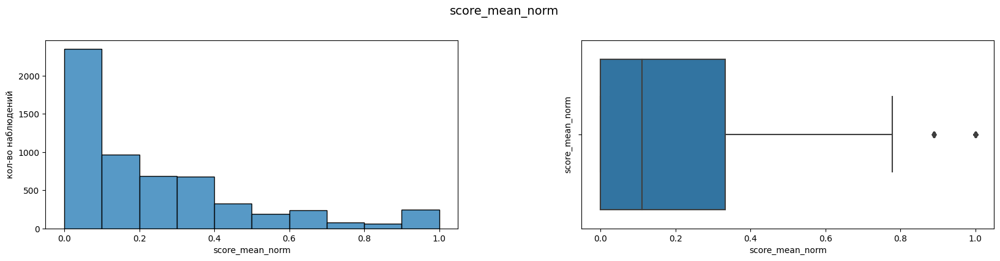

In [24]:
eda_numeric(df_annotations, 'score_mean_norm', selected_bins=10)

,count,share %
score_mean_norm,,
0.000000,2350,40.36
0.111111,965,16.58
0.222222,689,11.83
0.333333,678,11.65
0.444444,324,5.57
1.000000,247,4.24
0.666667,241,4.14
0.555556,193,3.32
0.777778,75,1.29


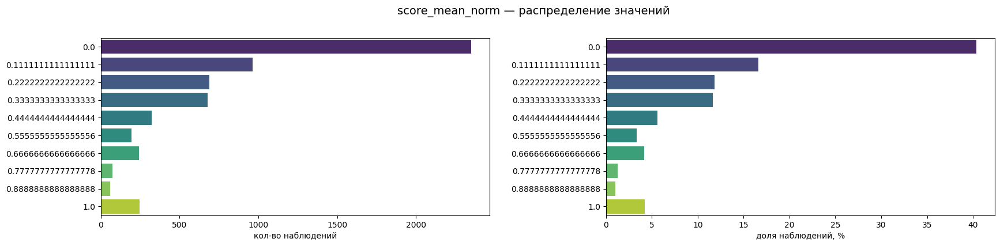

In [25]:
eda_categorical(df_annotations, 'score_mean_norm')

По оценке экспертов преобладают пары изображение-описания с низкой степень соответствия. Несмотря на использование среднего для аггрегирования оценок экспертов, аггрегированная оценка носит дискретный характер.

,count,share %
disagreement,,
0,3391,58.24
1,2272,39.02
2,156,2.68
3,3,0.05


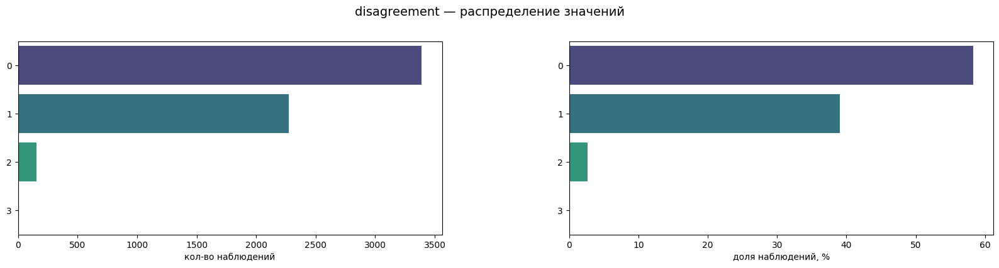

In [26]:
eda_categorical(df_annotations, 'disagreement')

Около 3% наблюдений обладают высокой степенью несогласия экспертов (оценка 2-3), перед обучением модели исключим эти наблюдения.

### Краудсорсинговая оценка

Найдем общее количество человек, принявщих участие в оценке соответствия для каждой пары изображение-описание.

In [27]:
df_annotations_crowd['total_num'] = df_annotations_crowd['positive_num'] + df_annotations_crowd['negative_num']

Т.к. общее количество  краудсорсинговых оценок кратно превосходит количество экспертных оценок и пар изображение-описания, определенных для обучения модели, объединим датафреймы, чтобы исключить из рассмотрения нерелевантные краудсорсинговые оценки.

In [28]:
df_annotations = pd.merge(df_annotations, df_annotations_crowd,
                         how = 'left',
                         on = ['image', 'query_id'])

In [29]:
df_annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            5822 non-null   object 
 1   query_id         5822 non-null   object 
 2   score_1          5822 non-null   int64  
 3   score_2          5822 non-null   int64  
 4   score_3          5822 non-null   int64  
 5   score_mean       5822 non-null   float64
 6   score_mean_norm  5822 non-null   float64
 7   disagreement     5822 non-null   int64  
 8   positive_share   2329 non-null   float64
 9   positive_num     2329 non-null   float64
 10  negative_num     2329 non-null   float64
 11  total_num        2329 non-null   float64
dtypes: float64(6), int64(4), object(2)
memory usage: 545.9+ KB


Краудсорсинговые оценки есть для 40% пар изображение-описание.

/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


,count,share %
total_num,,
NaN,3493,60.00
3.0,2266,38.92
4.0,45,0.77
5.0,13,0.22
6.0,5,0.09


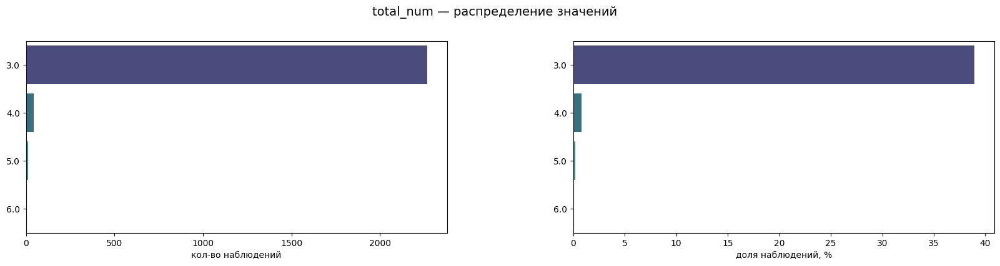

In [30]:
eda_categorical(df_annotations, 'total_num')

В абсолютном большинстве случаев каждую пару изображение-описание оценило 3 человека, что делает оценку ограниченнно надежной.

positive_share (positive_share) — описательные статистики



count    2329.000000
mean        0.198283
std         0.343315
min         0.000000
25%         0.000000
50%         0.000000
75%         0.333333
max         1.000000
Name: positive_share, dtype: float64

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


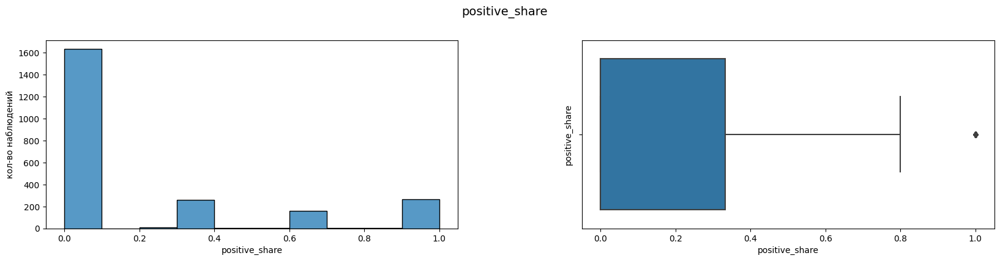

In [31]:
eda_numeric(df_annotations, 'positive_share', selected_bins=10)

С учетом того, что каждую пару изображение-описание, как правило, оценивало всего 3 человека, и для всех наблюдений не более 5 человек, распределение доли позитивно идентифицированных пар является дискретным.

### Сопоставимость экспертной и краудсорсинговой оценки

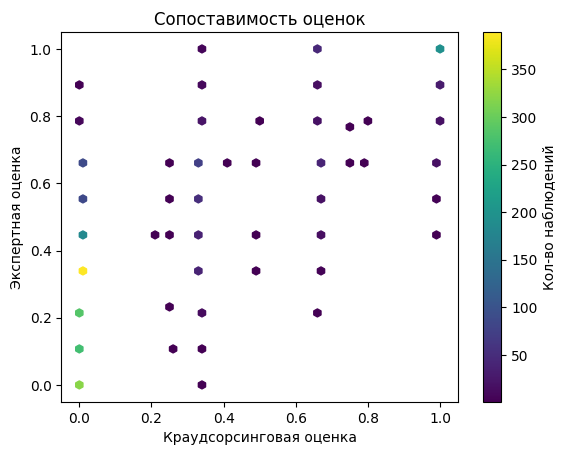

In [32]:
plt.hexbin(df_annotations.dropna()['positive_share'], 
           df_annotations.dropna()['score_mean_norm'], 
           gridsize=50, mincnt=1)  
plt.ylabel('Экспертная оценка')
plt.xlabel('Краудсорсинговая оценка')
plt.title('Сопоставимость оценок')
cb = plt.colorbar()
cb.set_label('Кол-во наблюдений')
plt.show()

Высокая сходимость краудсорсинговых оценок и оценок икспертов наблюдается только для низкого соответствия (несоответствия) изображений и описаний.

### Обзор изображений

Выборочно рассмотрим изображения, описания, краудсорсинговую и экспертные оценки.

In [33]:
df_train = pd.merge(df_train, df_annotations,
                   how = 'left',
                   on = ['image', 'query_id'])
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            5822 non-null   object 
 1   query_id         5822 non-null   object 
 2   query_text       5822 non-null   object 
 3   score_1          5822 non-null   int64  
 4   score_2          5822 non-null   int64  
 5   score_3          5822 non-null   int64  
 6   score_mean       5822 non-null   float64
 7   score_mean_norm  5822 non-null   float64
 8   disagreement     5822 non-null   int64  
 9   positive_share   2329 non-null   float64
 10  positive_num     2329 non-null   float64
 11  negative_num     2329 non-null   float64
 12  total_num        2329 non-null   float64
dtypes: float64(6), int64(4), object(3)
memory usage: 591.4+ KB


A man at a rodeo is thrown off a horse .
Экспертная оценка: 0.00
Краудсорсинговая оценка: nan


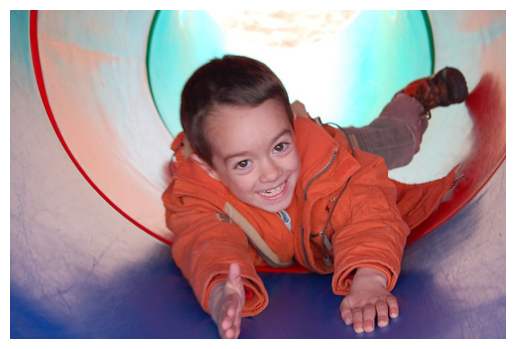


Hockey players with one taking a shot .
Экспертная оценка: 1.00
Краудсорсинговая оценка: 1.00


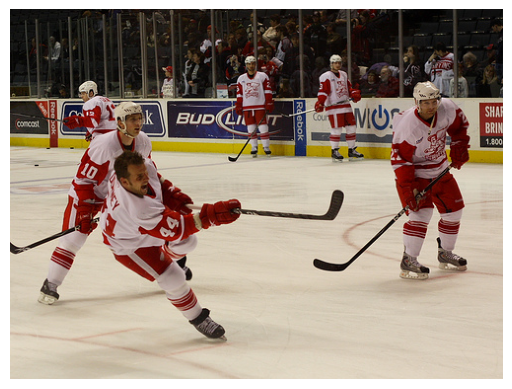


A skateboarder is skating down a very steep ramp in a skate park .
Экспертная оценка: 0.00
Краудсорсинговая оценка: nan


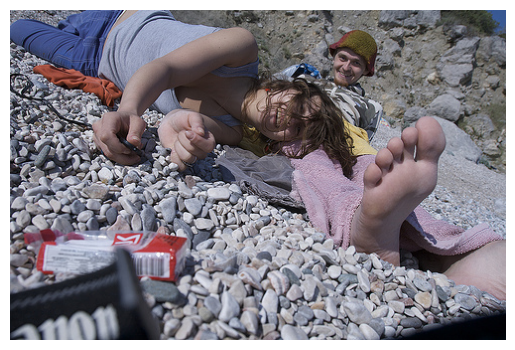


A little boy in a purple shirt and blue shorts playing with orange balls .
Экспертная оценка: 0.00
Краудсорсинговая оценка: nan


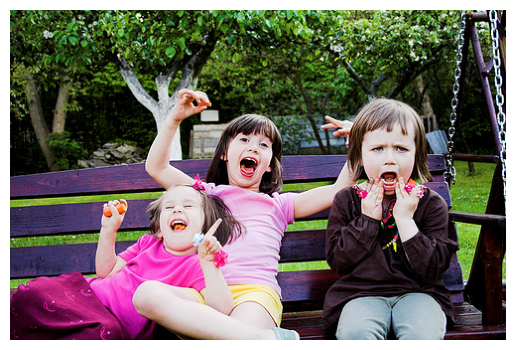


Dogs pulling a sled in a sled race .
Экспертная оценка: 1.00
Краудсорсинговая оценка: 1.00


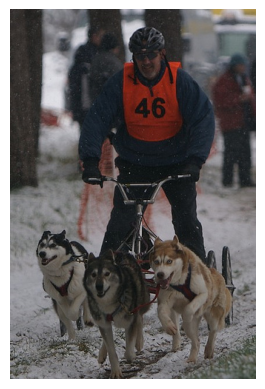


A man jumps while snow skiing .
Экспертная оценка: 0.67
Краудсорсинговая оценка: 0.33


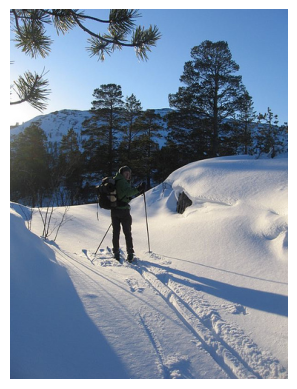


A surfer is jumping a wave .
Экспертная оценка: 1.00
Краудсорсинговая оценка: 1.00


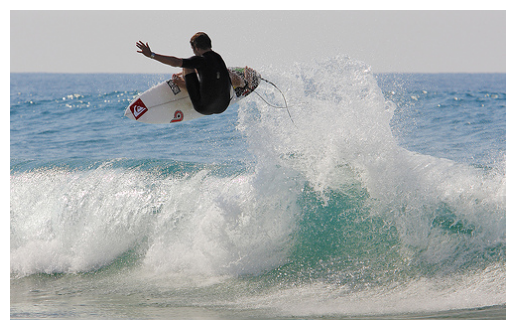


Boy in pajamas , with red and yellow toy , seated on tire near plants .
Экспертная оценка: 0.11
Краудсорсинговая оценка: nan


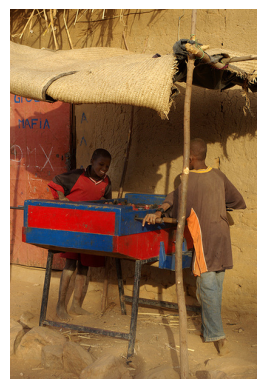


A young boy is riding a bike .
Экспертная оценка: 0.67
Краудсорсинговая оценка: 0.33


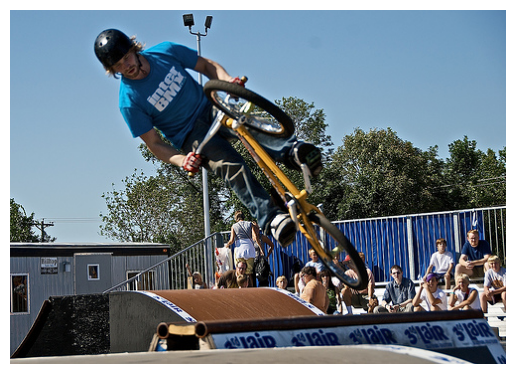


A person on a dirt bike is riding up a sandy hill .
Экспертная оценка: 0.78
Краудсорсинговая оценка: 1.00


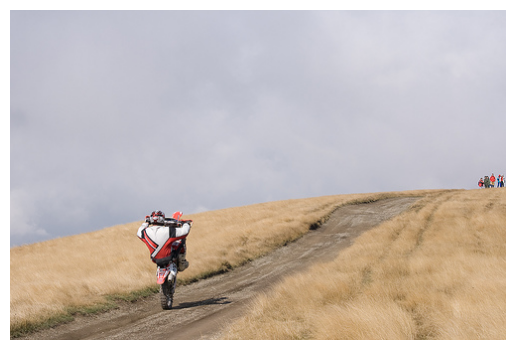


Four woman wearing formal gowns pose together and smile .
Экспертная оценка: 0.00
Краудсорсинговая оценка: 0.00


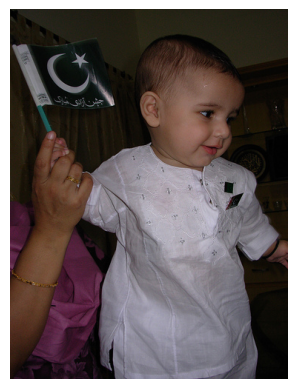


A person descends a rope from a cliff into the ocean .
Экспертная оценка: 0.11
Краудсорсинговая оценка: nan


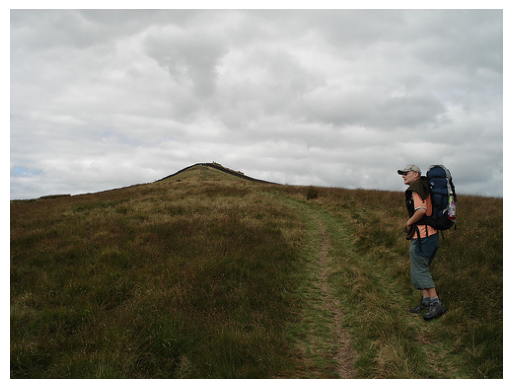


A yellow motorcyclist is popping a wheelie .
Экспертная оценка: 0.00
Краудсорсинговая оценка: nan


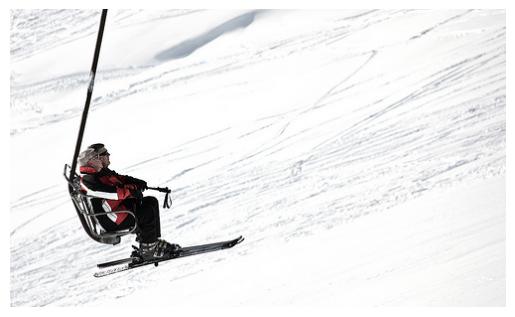


A dog jumps to catch a red Frisbee in the yard .
Экспертная оценка: 0.44
Краудсорсинговая оценка: 0.00


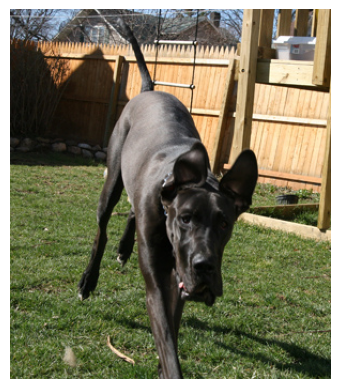


A crowd of people at an outdoor event
Экспертная оценка: 0.22
Краудсорсинговая оценка: 0.33


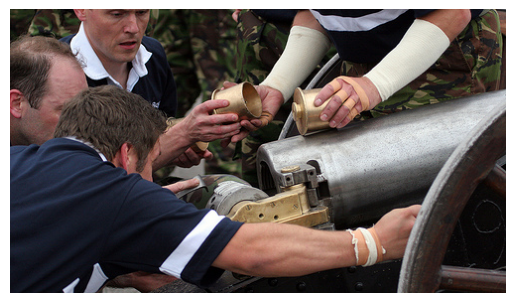

In [34]:
n = len(df_train)
sample_idx = np.random.choice(n, size=15, replace=False)

for i in sample_idx:
    print(df_train.loc[i, 'query_text'])
    print(f"Экспертная оценка: {df_train.loc[i, 'score_mean_norm']:.2f}")
    print(f"Краудсорсинговая оценка: {df_train.loc[i, 'positive_share']:.2f}")
    img = Image.open(BASE_PATH + 'train_images/' + df_train.loc[i, 'image']).convert('RGB')
    plt.imshow(img)
    plt.axis("off")
    plt.show()
    print()

Оценки экспертов соответствуют описанию в постановке задачи. Краудсорсинговые оценки, хотя есть для ограниченного числа пар изображение-описание, хорошо характеризуют степень соответствия и могут дополнить оценки экспертов. Также комбинация оценок может увеличить количество разных значений в целевой переменной и приблизить целевую переменную к непрерывной переменной, необходимой для использования модели линейной регрессии.

### Корректировка оценки экспертов с учетом краудсорсинга
Будем использовать линейную комбинацию со следующими коэффициентами:
* 0.6 для экспертных оценок
* 0.4 для кроудсорсинговых оценок

In [35]:
alpha = 0.6
beta = 1-  alpha

In [36]:
mask_crowd = df_train['positive_share'].notna()

df_train['target'] = df_train['score_mean_norm']
df_train.loc[mask_crowd, 'target'] = (
    alpha * df_train.loc[mask_crowd, 'score_mean_norm'] +
    beta  * df_train.loc[mask_crowd, 'positive_share']
)

target (target) — описательные статистики



count    5822.000000
mean        0.183138
std         0.247178
min         0.000000
25%         0.000000
50%         0.111111
75%         0.222222
max         1.000000
Name: target, dtype: float64

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


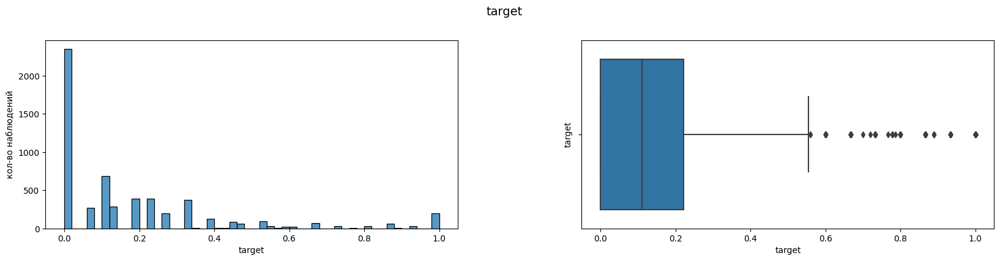

In [37]:
eda_numeric(df_train, 'target', selected_bins=50)

Комбинация двух оценок позволила приблизить целевую переменную к непрерывной переменной, преобладают значения, характеризующие несоответствие изображений и описаний.

<div class="alert alert-info"> <b>🎓 Комментарий студента:</b>

[Описание проекта:](https://practicum.yandex.ru/learn/data-scientist-plus/courses/3a2e4246-0e4f-422e-9a7f-da511f51cae0/sprints/318909/topics/6b4ec0b5-cdb5-4f32-94e1-91b252297ba7/lessons/36eda758-df47-4a4f-8ade-41a50a062b7c/)

> Обучите несколько моделей и подберите их гиперпараметры. В качестве моделей обязательно нужно рассмотреть:
> 1. Линейную регрессию;
> 2. Полносвязные нейронные сети.

Почему в постановке задачи базово предлагается решать задачу как регрессию, хотя целевая переменная по сути дискретная? Возможно, я упускаю какой-то подход к структурированию целевой переменной из исходных данных?

</div>

### Альтернативная целевая переменная

Т.к. оценки экспертов по своей структуре тяготеют к задаче классификации, рассмотрим ильтернативную целевую переменную:
* `0` - изображение не соответствует описанию
* `1` - изображение соответствует описанию

Предварительно аггрегируем оценки экспертов на основе голосования большинства.

In [38]:
df_train['score_majority'] = (df_train[['score_1', 'score_2', 'score_3']].mode(axis=1)[0])

Определим количество наблюдений, для которых оценки трех экспертов не совпали.

In [39]:
cols = ['score_1', 'score_2', 'score_3']
df_train['all_diff'] = (df_train[cols].nunique(axis=1) == 3)
df_train['all_diff'].sum()

126

Сформируем целевую переменную.

In [40]:
df_train['target_cls'] = df_train['score_majority'].apply(lambda x: 1 if x >= 2 else 0)

In [41]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            5822 non-null   object 
 1   query_id         5822 non-null   object 
 2   query_text       5822 non-null   object 
 3   score_1          5822 non-null   int64  
 4   score_2          5822 non-null   int64  
 5   score_3          5822 non-null   int64  
 6   score_mean       5822 non-null   float64
 7   score_mean_norm  5822 non-null   float64
 8   disagreement     5822 non-null   int64  
 9   positive_share   2329 non-null   float64
 10  positive_num     2329 non-null   float64
 11  negative_num     2329 non-null   float64
 12  total_num        2329 non-null   float64
 13  target           5822 non-null   float64
 14  score_majority   5822 non-null   float64
 15  all_diff         5822 non-null   bool   
 16  target_cls       5822 non-null   int64  
dtypes: bool(1), fl

,count,share %
target_cls,,
0,5019,86.21
1,803,13.79


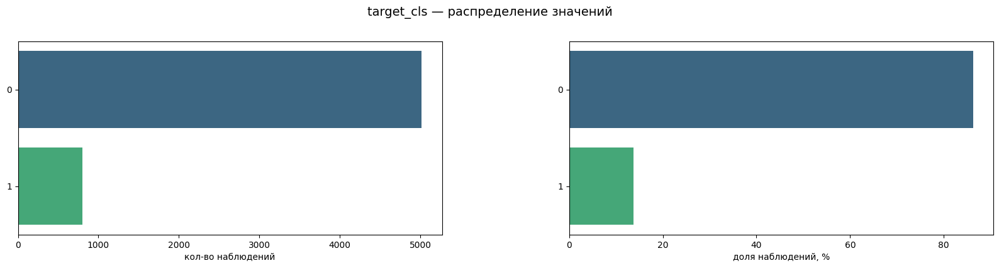

In [42]:
eda_categorical(df_train, 'target_cls')

Наблюдается значительный дисбаланс классов.

### Выводы:
* Целевая переменная для задачи регрессии, поставленной с учетом требований к проекту, целевая переменная определена как линейная комбинация краудсорсинговой оценки и оценки экспертов (оценка экспертов предварительно усреднена и нормализована)
* С учетом дискретности оценок экспертов предложена альтернативная целевая переменная, соответствующая задаче бинарной классификации

## Проверка данных с учетом юридического ограничения

<div class="alert alert-info"> <b>🎓 Комментарий студента:</b>

[Описание проекта:](https://practicum.yandex.ru/learn/data-scientist-plus/courses/3a2e4246-0e4f-422e-9a7f-da511f51cae0/sprints/318909/topics/6b4ec0b5-cdb5-4f32-94e1-91b252297ba7/lessons/36eda758-df47-4a4f-8ade-41a50a062b7c/)

> Исключите из обучающего датасета пары, которые, исходя из подготовленного вами списка слов, могут попадать под юридические ограничения.

Зачем убирать из обучающей выборки пары с упоминанием детей в тексте? Такой подход уменьшает объем данных, на которых обучается модель, не решая юридическую проблему: изображения детей могут сохраниться в обучающей выборке в парах, где изображение не соответствует описанию (прим. описан взрослый, на изображении ребенок). Возможно, имело бы смысл выкинуть именно картинки с изображениями детей, но кажется, при отсутствии целевой разметки по детям, это можно сделать только вручную, удалив картинки из папки с исходными данными для обучения.

</div>

### Cписок слов и словосочетаний, описавающих детей до 16 лет.

In [43]:
child_keywords = [
    "baby", "newborn", "infant", "toddler", "child", "children", "kid", "kids",
    "boy", "little boy", "little girl",
    "preteen", "teen", "teenager", "junior", "youth", "youngster",
    "schoolboy", "schoolgirl", "schoolkid",
    "young boy", "young girl", "young child",
    "little kid", "little child", "small boy", "small girl",
    " son", "daughter", "niece", "nephew", "grandson", "granddaughter",
    "pupil", "kindergarten", "playground"
]

### Функция для определения запрещенных слов и словосочетаний в тексте

In [44]:
def is_child_caption(text):
    """
    Return True if caption likely describes a child.
    """
    if not isinstance(text, str):
        return False
    
    t = text.lower()
    
    for kw in child_keywords:
        if kw in t:
            return True

    return False

### Обработка данных с учетом юридического ограничения

В датафрейме с обучающей выборкой создадим дополнительный признак, характеризующий описывает ли текст ребенка.

In [45]:
df_train['child_flag'] = df_train['query_text'].apply(is_child_caption)

Выборочно проверим, корректно ли размечен датафрейм с использованием функции.

In [46]:
df_train[df_train['child_flag']].sample(25)[['query_text']]

,query_text
4473,Child in blue trunks splashing in blue kiddie pool
3475,A little girl sits in a plastic swing set .
5426,Two children look up .
5164,Two boys have made a goal out of two jackets in order to play soccer .
3156,Two women with a baby carriage in a building next to a table and chairs .
2189,"A young boy , playing basketball , is getting ready to take a shot ."
831,A rodeo rider gets tossed up into the air by a black bull as fellow cowboys look on .
3863,A little girl has dunked her head in a bowl of water .
4824,The helmeted boy is doing a stunt on a skateboard .
1618,A toddler in a red jacket is balancing on top of snow .


In [47]:
df_train[~df_train['child_flag']].sample(25)[['query_text']]

,query_text
1745,A person swimming in water nearby rocks and a small waterfall .
2970,Two white dogs running
3522,"Crowded Mexican restaurant , empty chair in foreground ."
1325,A person on the beach beside the ocean at sunset .
3706,A man wearing all black and a black hat is smiling .
4275,People stand outside near a concrete wall and a window .
4973,A skateboarder jumps his board down a flight of stairs .
1182,A swimmer is doing the backstroke in the swimming pool .
4942,A white dog runs past a fence on a snowy day .
13,A girl wearing a yellow shirt and sunglasses smiles .


Разметка произведена корректно.

In [48]:
df_train['child_flag'].sum()

1354

В обучающей выборке 1354 наблюдения включают тексты с упоминанием детей.

In [49]:
df_train.loc[(df_train['child_flag']) | (df_train['disagreement'] > 1)]['image'].count()

1475

Из обучающей выборки будет удалено 1475 наблюдений:
* с описанием детей в тексте
* с высоким уровнем несогласия экспертов при оценке соответствия изображения и описания

In [50]:
df_train = df_train.loc[~((df_train['child_flag']) | (df_train['disagreement'] > 1))].copy()
#df_train = df_train.loc[~(df_train['disagreement'] > 1)].copy()
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4347 entries, 12 to 5821
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   image            4347 non-null   object 
 1   query_id         4347 non-null   object 
 2   query_text       4347 non-null   object 
 3   score_1          4347 non-null   int64  
 4   score_2          4347 non-null   int64  
 5   score_3          4347 non-null   int64  
 6   score_mean       4347 non-null   float64
 7   score_mean_norm  4347 non-null   float64
 8   disagreement     4347 non-null   int64  
 9   positive_share   1809 non-null   float64
 10  positive_num     1809 non-null   float64
 11  negative_num     1809 non-null   float64
 12  total_num        1809 non-null   float64
 13  target           4347 non-null   float64
 14  score_majority   4347 non-null   float64
 15  all_diff         4347 non-null   bool   
 16  target_cls       4347 non-null   int64  
 17  child_flag       4

В обучающей выборке сохранено 4347 наблюдений из 5822 (75%)

In [51]:
df_train['all_diff'].sum()

0

По результатам обработки данных исключены наблюдения с тремя разными экспертными оценками.

### Выводы:
* Разработана функция для поиска упоминания детей в тексте
* По результатам обработки обучающей выборки с учетом юридического ограничения сохранено 75% наблюдений

## Векторизация текстов

Для векторизации текстов будем использовать $BERT$ без учета прописных и строчных букв.

### Предварительная обработка текстов
* Удалим
    * переносы на новую строку
    * лишние пробелы
* Приведем все тексты к нижнему регистру

Сохраним артикли, предлоги, знаки припинания и т.п., т.к. они используются $BERT$ для определения контекста.

In [52]:
RE_NEWLINES = re.compile(r"[\r\n\t]+")
RE_WHITESPACE = re.compile(r"\s+")
RE_SPACE_BEFORE_PUNCT = re.compile(r"\s+([.,!?;:])")

def clean_text(text, lower):
    text = RE_NEWLINES.sub(" ", text)
    text = RE_WHITESPACE.sub(" ", text).strip()
    text = RE_SPACE_BEFORE_PUNCT.sub(r"\1", text)

    if lower:
        text = text.lower()

    return text

In [53]:
df_train['query_text'] = df_train['query_text'].apply(lambda t: clean_text(t, lower=True))
df_train['query_text'].sample(10)

1226                                                         person snowboarding at a ski slope.
2815             a woman wearing black clothes, a purple scarf, and a pink hat is riding a bike.
652     a man in a white uniform jumps while holding a basketball as another in blue blocks him.
3847                     a surfer catches a nice wave in the ocean and tries to pull himself up.
3225                            two people are sitting next to a wood-stacked campfire at night.
1722                        a man wearing red shorts is holding onto the rocks beside the water.
313                                      a small brown and white dog running through tall grass.
5118                  a woman in a pink sweater looks pensive next to a crowd of laughing women.
101                                          two long-haired puppy dogs have a romp in the snow.
3213                 a white dog is walking through a river that runs through a rocky landscape.
Name: query_text, dtype: objec

Тексты обработаны корректно.

### Токенизация и эмбеддинги

In [54]:
tokenizer = transformers.BertTokenizer.from_pretrained('bert-base-uncased')
model = transformers.BertModel.from_pretrained('bert-base-uncased')
model.eval()

2025-11-20 13:32:15.958749: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763645535.977946     403 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763645535.984840     403 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False

In [55]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print("Device:", device)

Device: cuda


In [56]:
model.to(device)

BertModel(
  (embeddings): BertEmbeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (token_type_embeddings): Embedding(2, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (encoder): BertEncoder(
    (layer): ModuleList(
      (0-11): 12 x BertLayer(
        (attention): BertAttention(
          (self): BertSdpaSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.1, inplace=False)
          )
          (output): BertSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
            (dropout): Dropout(p=0.1, inplace=False

Перед векторизацией определим максимальное необходимое количество токенов.

In [57]:
lengths = [len(tokenizer.encode(text, add_special_tokens=True)) for text in tqdm(df_train['query_text'])]

100%|██████████| 4347/4347 [00:01<00:00, 4102.65it/s]


In [58]:
print(f"Mean length: {np.mean(lengths):.1f}")
print(f"Median length: {np.median(lengths):.1f}")
print(f"95th percentile: {np.percentile(lengths, 95):.0f}")
print(f"Max length: {max(lengths)}")

Mean length: 14.0
Median length: 14.0
95th percentile: 21
Max length: 36


Для обработки всех текстов достаточно 36 токенов.

In [59]:
texts = df_train['query_text'].tolist()

In [60]:
embeddings = []
batch_size = 128
max_length = 36

In [61]:
with torch.no_grad():
    for i in tqdm(range(0, len(texts), batch_size)):
        batch_texts = texts[i:i+batch_size]

        encoded = tokenizer(
            batch_texts,
            add_special_tokens=True,
            truncation=True,
            max_length=max_length,
            padding=True,
            return_attention_mask=True,
            return_tensors='pt'
        )

        
        input_ids = encoded["input_ids"].to(device)
        attention_mask = encoded["attention_mask"].to(device)
        
        out = model(input_ids=input_ids, attention_mask=attention_mask)

        current_embeddings = out.last_hidden_state[:, 0, :].detach().cpu().numpy()
        embeddings.append(current_embeddings)
        #start, end = i, i + len(batch_texts)

100%|██████████| 34/34 [00:05<00:00,  5.78it/s]


In [62]:
text_features = np.concatenate(embeddings, axis=0)
text_features.shape

(4347, 768)

**Вывод:** в результате векторизации текстов создано 768 признаков, характеризующих описание изображения.

## Векторизация изображений

Для векторизации изображений будем использовать $ResNet18$.

In [63]:
resnet = models.resnet18(pretrained=True)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [64]:
for param in resnet.parameters():
    param.requires_grad_(False)

In [65]:
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules).to(device)
resnet.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

In [66]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
]) 

In [67]:
images = df_train['image'].tolist()
batch_size = 32
vectors = []

In [68]:
for i in tqdm(range(0, len(images), batch_size)):
    batch_files = images[i:i + batch_size]
    batch_tensors = []

    for image in batch_files:
        img = Image.open(BASE_PATH + "train_images/" + image).convert("RGB")
        tensor = preprocess(img)
        batch_tensors.append(tensor)

    batch_tensor = torch.stack(batch_tensors).to(device)

    with torch.no_grad():
        output_tensor = resnet(batch_tensor)
        output_tensor = output_tensor.view(output_tensor.size(0), -1)

    batch_np = output_tensor.cpu().numpy()
    vectors.append(batch_np)

100%|██████████| 136/136 [00:32<00:00,  4.23it/s]


In [69]:
image_features = np.concatenate(vectors, axis=0)
image_features.shape

(4347, 512)

**Вывод:** в результате векторизации изображений создано 512 признаков, характеризующих каждое изображение.

<div class="alert alert-info"> <b>🎓 Комментарий студента:</b>

[Описание проекта: Компьютерное зрение в PyTorch](https://practicum.yandex.ru/learn/data-scientist-plus/courses/3a2e4246-0e4f-422e-9a7f-da511f51cae0/sprints/318909/topics/8b8fe076-7b26-4193-a856-f09d1af5ae36/lessons/5216a02c-256d-4bf5-8d02-0fab3eecd143/)

> В нашем случае, нужно взять все слои, кроме последних двух

```
modules = list(resnet.children())[:-2]
resnet = nn.Sequential(*modules) 
```

В теории по проекту рекомендуется использовать сверточную сеть без двух последних слоев. В этом случае (без global average pooling) размерность вектора получается 25 088, что приводит к огромной размерности в условиях относительно маленькой обучающей выборки. В моих экспериментах большая размерность не помогала обучению моделей, поэтому остановилась на варианте выше.

Как лучше поступать с векторизацией изображений в этой задаче?

</div>

## Объединение векторов

In [70]:
features = np.concatenate([image_features, text_features], axis=1)
features.shape

(4347, 1280)

In [71]:
y = df_train['target'].values
y.shape

(4347,)

In [72]:
y_cls = df_train['target_cls'].values
y_cls.shape

(4347,)

**Вывод:** в результате объединения векторов изображений и текстов получено 1280 признаков.

## Выбор оптимальной модели
Рассмотрим следующие модели:
1. Бейзлайн - линейная регрессия с регуляризацияей (в соответствии с требованиями к проекту, отмеченными во введении)
2. Нейронная сеть
3. Градиентный бустинг

Дополнительно рассмотрим альтернативный подход к моделированию - бинарную классификацию с использованием нейронной сети.

Подбор гиперпараметров будем осуществлять с помощью кросс-валидации.

In [73]:
models_list = []

### Обучающая и тестовая выборка
При разбивке данных на обучающую и тестовую выборку будем учитывать, что необходимо исключить попадание одного и того же изображения и в обучающую, и в тестовую выборку.

In [74]:
gss = GroupShuffleSplit(n_splits=1, test_size=TEST_SIZE, random_state=RANDOM_STATE)

In [75]:
train_idx, test_idx = next(gss.split(X=features, y=y, groups=df_train["image"]))

X_train = features[train_idx]
X_test   = features[test_idx]
y_train = y[train_idx]
y_test   = y[test_idx]
y_cls_train = y_cls[train_idx]
y_cls_test = y_cls[test_idx]
groups_train = df_train["image"].values[train_idx]

In [76]:
print('X_train:', X_train.shape)
print('y_train:', y_train.shape)
print('y_cls_train:', y_cls_train.shape)
print('groups_train:', groups_train.shape)
print()
print('X_test:', X_test.shape)
print('y_test:', y_test.shape)
print('y_cls_test:', y_cls_test.shape)

X_train: (3227, 1280)
y_train: (3227,)
y_cls_train: (3227,)
groups_train: (3227,)

X_test: (1120, 1280)
y_test: (1120,)
y_cls_test: (1120,)


### Метрики

Для задачи регресии в качестве целевой метрики будем использовать $MAE$, чтобы минимизировать абсолютное отклонение предсказания от фактического значения, за счет этого повышая вероятность получения правильного изображения на этапе поиска по запросу. В качестве дополнительных метрик будем рассматривать $RMSE$ и $R^2$.

In [77]:
scoring = {
    'r2_score': 'r2',
    'mse': 'neg_mean_squared_error',
    'mae': 'neg_mean_absolute_error',
}

### Линейная регрессия

In [78]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', Ridge())
])

In [79]:
param_grid = [
    {
        'model': [Lasso(random_state = RANDOM_STATE)],
        'model__alpha' : np.linspace(0.1, 1, 10).tolist() + list(range(2, 6)),
    },
    
    {
        'model': [Ridge(solver='svd', random_state = RANDOM_STATE)],
        'model__alpha' : np.linspace(0.1, 1, 10).tolist() + list(range(2, 6)),
    }
    
]

In [80]:
val_gss = GroupShuffleSplit(
    n_splits=5,
    test_size=0.2,
    random_state=RANDOM_STATE
)

In [81]:
model_details, reg = run_randomized_search_regression(
    'Regression',
    X_train, y_train,
    pipe, param_grid,
    scoring, refit = 'mae', sort_by = 'mean_test_mae',
    n_iter=25, cv=val_gss, groups = groups_train,
    random_state=RANDOM_STATE, n_jobs=-1
)

Среднее время обучения оптимальной модели при кросс-валидации: 0.24 с

Среднее значение метрики R2_SCORE при кросс-валидации: -0.0055
Среднее значение метрики MSE при кросс-валидации: 0.0682
Среднее значение метрики MAE при кросс-валидации: 0.1892
Среднее значение метрики RMSE при кросс-валидации: 0.2611

Время предсказания на обучающей выборке: 0.0525 с
R² (train):   -0.0000
MSE (train):  0.0676
RMSE (train): 0.2600
MAE (train):  0.1901



In [82]:
models_list.append(model_details)

### Нейронная сеть

Т.к. постановка задачи предполагает, что выходное значение принимает значение от 0 до 1, на выходе нейронной сети будем использовать сигмоиду в качестве функции активации.

In [83]:
class TwoHiddenLayerNet(nn.Module):
    def __init__(
        self, 
        n_in_neurons, 
        n_hidden_neurons_1, 
        n_hidden_neurons_2,
        act_1="relu", 
        act_2="relu",
        dropout1=0.0,        # dropout after 1st hidden layer
        dropout2=0.0         # dropout after 2nd hidden layer
    ):
        """
        Two-hidden-layer feedforward network for regression-like output in [0, 1].

        Parameters
        ----------
        n_in_neurons : int
            Number of input features.
        n_hidden_neurons_1 : int
            Number of neurons in the 1st hidden layer.
        n_hidden_neurons_2 : int
            Number of neurons in the 2nd hidden layer.
        act_1, act_2 : str, default="relu"
            Activation functions for hidden layers. Options: "relu", "tanh", "sigmoid".
        dropout1, dropout2 : float, default=0.0
            Dropout probabilities after 1st and 2nd hidden layers (0.0 = no dropout).
        """
        super().__init__()
        
        self.fc1 = nn.Linear(n_in_neurons, n_hidden_neurons_1)
        self.fc2 = nn.Linear(n_hidden_neurons_1, n_hidden_neurons_2)
        self.fc3 = nn.Linear(n_hidden_neurons_2, 1)

        def get_activation(name):
            if name == "sigmoid":
                return nn.Sigmoid()
            elif name == "tanh":
                return nn.Tanh()
            else:
                return nn.ReLU()

        self.act1 = get_activation(act_1)
        self.act2 = get_activation(act_2)

        # Dropout layers (do nothing if p=0.0)
        self.drop1 = nn.Dropout(p=dropout1)
        self.drop2 = nn.Dropout(p=dropout2)

        # Xavier init
        for layer in [self.fc1, self.fc2, self.fc3]:
            nn.init.xavier_uniform_(layer.weight)
            nn.init.zeros_(layer.bias)

    def forward(self, x):
        x = self.act1(self.fc1(x))
        x = self.drop1(x)
        x = self.act2(self.fc2(x))
        x = self.drop2(x)
        x = self.fc3(x)
        x = torch.sigmoid(x)
        return x

In [84]:
net = NeuralNetRegressor(
    module=TwoHiddenLayerNet,
    module__n_in_neurons=X_train.shape[1],
    module__n_hidden_neurons_1=256,
    module__n_hidden_neurons_2=64,
    module__act_1="relu",
    module__act_2="relu",
    module__dropout1=0.0,
    module__dropout2=0.0,
    max_epochs=20,
    lr=1e-3,
    optimizer=torch.optim.Adam,
    criterion=nn.MSELoss,
    batch_size=32,
    iterator_train__shuffle=True,
    device=device,
)

In [85]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('net', net),
])

In [86]:
param_grid = {

    'net__module__n_hidden_neurons_1': [64, 128, 256, 512],
    'net__module__n_hidden_neurons_2': [32, 64, 128],
    
    'net__module__dropout1': [0.0, 0.3, 0.5, 0.8],
    'net__module__dropout2': [0.0, 0.3, 0.5, 0.8],
    
    'net__lr': loguniform(1e-4, 5e-3),
    'net__batch_size': [16, 32, 64],
    'net__max_epochs': [15, 20, 30],
}

In [87]:
model_details, neural_network = run_randomized_search_regression(
    'TwoHiddenLayerNet',
    X_train.astype('float32'), y_train.reshape(-1, 1).astype('float32'),
    pipe, param_grid,
    scoring, refit = 'mae', sort_by = 'mean_test_mae',
    n_iter=25, cv=val_gss, groups = groups_train,
    random_state=RANDOM_STATE, n_jobs=-1
)

  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1762        0.1119  0.5513
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1397        0.0988  0.5428
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1587        0.0945  0.5428
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1546        0.1180  0.5390
      2        0.1124        0.1130  0.1528
      2        0.1027        0.1023  0.1522
      2        0.1084        0.0988  0.1505
      2        0.1143        0.1187  0.1505
      3        0.1039        0.1131  0.1527
      3        0.1013        0.0992  0.1499
      3        0.0965        0.1002  0.1528
      3        0.1095        0.1187  0.1518
      4        0.1034        0.1132  0.1511
      4        0.1007        0.0984  0.1486
      4        0.1019        0.0

/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1464        0.1112  0.4681
      2        0.1093        0.1128  0.1452
      3        0.1060        0.1127  0.1467
      4        0.1054        0.1124  0.1342
      5        0.0995        0.1097  0.1295
      6        0.0980        0.1068  0.1300
      7        0.0985        0.1025  0.1359
      8        0.1023        0.1035  0.1615
      9        0.0958        0.0931  0.1726
     10        0.0917        0.0874  0.1617
  epoch    train_loss    valid_loss     dur
-------  ------------  ------------  ------
      1        0.1131        0.1068  0.5158
     11        0.0861        0.0808  0.1472
      2        0.0908        0.0807  0.1509
     12        0.0848        0.0751  0.1503
      3        0.0811        0.0663  0.1613
     13        0.0827        0.0680  0.1597
      4        0.0732        0.0648  0.1512
     14        0.0773        0.0724  0.1441
      5        0.0662        0.0

Дополнительно повторно запустим обучение модели с оптимальными гиперпараметрами, чтобы определить, оптимально ли подобрано количество эпох при заданном learning rate.

In [88]:
model_details['best_params']

{'net__batch_size': 64,
 'net__lr': 0.0005954553793888993,
 'net__max_epochs': 30,
 'net__module__dropout1': 0.3,
 'net__module__dropout2': 0.5,
 'net__module__n_hidden_neurons_1': 512,
 'net__module__n_hidden_neurons_2': 128}

In [89]:
net_best = NeuralNetRegressor(
    module=TwoHiddenLayerNet,
    module__n_in_neurons=X_train.astype('float32').shape[1],
    module__n_hidden_neurons_1=model_details['best_params']['net__module__n_hidden_neurons_1'],
    module__n_hidden_neurons_2=model_details['best_params']['net__module__n_hidden_neurons_2'],
    module__act_1="relu",
    module__act_2="relu",
    module__dropout1=model_details['best_params']['net__module__dropout1'],
    module__dropout2=model_details['best_params']['net__module__dropout2'],
    max_epochs=model_details['best_params']['net__max_epochs']+10,
    lr=model_details['best_params']['net__lr'],
    optimizer=torch.optim.Adam,
    batch_size=model_details['best_params']['net__batch_size'],
    iterator_train__shuffle=True,
    callbacks=[
        EpochScoring("neg_mean_absolute_error", lower_is_better=False, on_train=False, name="val_mae")
    ],
    device=device,
)

In [90]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [91]:
net_best.fit(X_train_scaled.astype('float32'), y_train.reshape(-1, 1).astype('float32'))

  epoch    train_loss    val_mae    valid_loss     dur
-------  ------------  ---------  ------------  ------
      1        0.1019    -0.1829        0.0861  0.1282
      2        0.0777    -0.1747        0.0802  0.1217
      3        0.0651    -0.1661        0.0680  0.1215
      4        0.0580    -0.1634        0.0619  0.1193
      5        0.0485    -0.1590        0.0549  0.1267
      6        0.0448    -0.1574        0.0598  0.1230
      7        0.0420    -0.1634        0.0575  0.1264
      8        0.0378    -0.1578        0.0544  0.1311
      9        0.0340    -0.1531        0.0535  0.1304
     10        0.0301    -0.1542        0.0541  0.1248
     11        0.0292    -0.1542        0.0554  0.1261
     12        0.0254    -0.1488        0.0519  0.1270
     13        0.0239    -0.1490        0.0530  0.1266
     14        0.0222    -0.1488        0.0526  0.1276
     15        0.0216    -0.1545        0.0555  0.1239
     16        0.0184    -0.1484        0.0532  0.1263
     17   

<class 'skorch.regressor.NeuralNetRegressor'>[initialized](
  module_=TwoHiddenLayerNet(
    (fc1): Linear(in_features=1280, out_features=512, bias=True)
    (fc2): Linear(in_features=512, out_features=128, bias=True)
    (fc3): Linear(in_features=128, out_features=1, bias=True)
    (act1): ReLU()
    (act2): ReLU()
    (drop1): Dropout(p=0.3, inplace=False)
    (drop2): Dropout(p=0.5, inplace=False)
  ),
)

Изменение количества эпох не позволяет значительно улучшить качество модели по $MAE$.

In [92]:
models_list.append(model_details)

### Градиентный бустинг

In [93]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('model', lgb.LGBMRegressor(random_state=RANDOM_STATE)),
])

In [94]:
param_grid = [
    {
        'model__n_estimators': [100, 300, 500],          
        'model__learning_rate': [0.01, 0.05, 0.1],       
        'model__num_leaves': [15, 31, 63],               
        'model__max_depth': [-1, 5, 10, 15],             
        'model__min_child_samples': [10, 20, 50, 100],   
        'model__subsample': [0.6, 0.8, 1.0],             
        'model__colsample_bytree': [0.6, 0.8, 1.0],      
        'model__reg_alpha': [0.0, 0.1, 1.0],             
        'model__reg_lambda': [0.0, 0.1, 1.0]
    }
]

In [95]:
model_details, lgb = run_randomized_search_regression(
    'LGBMRegressor',
    X_train, y_train,
    pipe, param_grid,
    scoring, refit = 'mae', sort_by = 'mean_test_mae',
    n_iter=10, cv=val_gss, groups = groups_train,
    random_state=RANDOM_STATE, n_jobs=-1
)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.095151 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 323622
[LightGBM] [Info] Number of data points in the train set: 2567, number of used features: 1280
[LightGBM] [Info] Start training from score 0.195692
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.088243 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 323502
[LightGBM] [Info] Number of data points in the train set: 2599, number of used features: 1280
[LightGBM] [Info] Start training from score 0.186908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

In [96]:
models_list.append(model_details)

### Оптимальная модель

In [97]:
pd.DataFrame(models_list).sort_values(by = 'cv_mae')

,description,mean_fit_time,cv_r2_score,cv_mse,cv_mae,cv_rmse,prediction_time,train_r2,train_mse,train_rmse,train_mae,best_params
1,TwoHiddenLayerNet,4.811355,0.224580,0.052366,0.150675,0.228836,0.111355,7.827678e-01,0.014683,0.121172,0.070894,"{'net__batch_size': 64, 'net__lr': 0.0005954553793888993, 'net__max_epochs': 30, 'net__module__dropout1': 0.3, 'net__module__dropout2': 0.5, 'net__module__n_hidden_neurons_1': 512, 'net__module__n_hidden_neurons_2': 128}"
2,LGBMRegressor,103.938311,0.200242,0.053994,0.165616,0.232367,0.120889,9.930400e-01,0.000470,0.021689,0.014790,"{'model__subsample': 0.8, 'model__reg_lambda': 0.0, 'model__reg_alpha': 0.0, 'model__num_leaves': 31, 'model__n_estimators': 500, 'model__min_child_samples': 20, 'model__max_depth': 10, 'model__learning_rate': 0.05, 'model__colsample_bytree': 0.6}"
0,Regression,0.237615,-0.005540,0.068153,0.189221,0.261062,0.052542,-2.220446e-16,0.067590,0.259981,0.190118,"{'model__alpha': 1.0, 'model': Lasso(random_state=42)}"


Результаты обучения моделей представлены в таблице выше. Нейронная сеть обеспечивает наилучшее качество по критерию $MAE$ и другим метрикам, поэтому будем рассматривать нейронную сеть в качестве оптимальной модели. При этом следует обратить внимание, что значение $MAE$ достаточно велико: 0.15 для диапазона значений целевой переменной от 0 до 1. Это может привести к низкому качеству поиска изображений по запросу. Данная проблема может быть связана с тем, что при обучении целевая переменная принимает ограниченное количество значений, что затрудняет обучение модели.

### Альтернативный подход - бинарная классификация

#### Выбор метрики

В качестве целевой метрики будем рассматривать $F1$, т.к. минимизация ошибок первого и второго рода одинаково важна для эффиктивного поиска картинок по запросу. В качестве дополнительных метрик будем рассматривать $ROC-AUC$, accuracy, recall и precision.

In [98]:
scoring_cls = {
    'f1_score': 'f1',
    'roc_auc_score': 'roc_auc',
    'accuracy_score': 'accuracy',
    'precision_score' : 'precision', 
    'recall_score' : 'recall'
}

#### Обучение модели

In [99]:
net_cls = NeuralNetClassifier(
    module=TwoHiddenLayerNet,
    module__n_in_neurons=X_train.shape[1],
    module__n_hidden_neurons_1=256,
    module__n_hidden_neurons_2=64,
    module__act_1="relu",
    module__act_2="relu",
    module__dropout1=0.0,
    module__dropout2=0.0,
    max_epochs=20,
    lr=1e-3,
    optimizer=torch.optim.Adam,
    criterion=nn.BCELoss,
    batch_size=32,
    iterator_train__shuffle=True,
    device=device,
)

In [100]:
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('net', net_cls),
])

In [101]:
param_grid = {

    'net__module__n_hidden_neurons_1': [64, 128, 256, 512],
    'net__module__n_hidden_neurons_2': [32, 64, 128],
    
    'net__module__dropout1': [0.0, 0.3, 0.5, 0.8],
    'net__module__dropout2': [0.0, 0.3, 0.5, 0.8],
    
    'net__lr': loguniform(1e-4, 5e-3),
    'net__batch_size': [16, 32, 64],
    'net__max_epochs': [15, 20, 30],
}

In [102]:
model_details, neural_network_cls = run_randomized_search_classification(
    'TwoHiddenLayerNet',
    X_train.astype('float32'), y_cls_train.reshape(-1, 1).astype('float32'),
    pipe, param_grid,
    scoring_cls, refit = 'f1_score', sort_by = 'mean_test_f1_score',
    n_iter=25, cv=val_gss, groups = groups_train,
    random_state=RANDOM_STATE, n_jobs=-1
)


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.075579 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [

/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.4416       0.8431        0.4274  0.4525
      2        0.7111       0.8373        0.4286  0.1482
      3        0.6188       0.8373        0.4191  0.1477
      4        0.5236       0.8373        0.4112  0.1446
      5        0.5109       0.8373        0.3969  0.1584
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.5962       0.8366        0.4044  0.4917
      6        0.4764       0.8373        0.3965  0.1826
      2        0.4181       0.8327        0.4188  0.1870
      7        0.4694       0.8373        0.3944  0.1668
      3        0.3834       0.8444        0.3919  0.1710
      8        0.4472       0.8373        0.3960  0.1527
      4        0.3582       0.8385        0.3852  0.1977
      9        0.4112       0.8373        0.3939  0.1774
      5        0.3232       0.8

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


     13        0.9531       0.8462        0.4271  0.1581
      6        1.7466       0.8527        0.3814  0.1627
     11        1.0785       0.8460        0.4024  0.1701
     14        0.9565       0.8462        0.4247  0.1608
      7        1.4972       0.8508        0.3942  0.1723
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        1.5952       0.8196        0.4884  0.1577
     12        1.0531       0.8460        0.4002  0.1603
     15        0.8772       0.8462        0.4196  0.1647
      8        1.5916       0.8508        0.4053  0.1607
      2        1.4123       0.8255        0.4644  0.1544
     13        0.9996       0.8460        0.4013  0.1637
     16        0.8618       0.8462        0.4209  0.1658
      9        1.4600       0.8508        0.4166  0.1589
      3        1.3634       0.8294        0.4437  0.1565
     14        0.9827       0.8460        0.4012  0.1617
     17        0.8292       0.8

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


     19        0.8862       0.8460        0.3897  0.1854
      9        0.9795       0.8373        0.4115  0.1541
     15        1.0015       0.8508        0.4646  0.1617
     20        0.8541       0.8460        0.3906  0.1575
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7444       0.8288        0.4752  0.2693
     10        0.9159       0.8373        0.4098  0.1528
     16        0.9898       0.8508        0.4683  0.1566
     11        0.9797       0.8373        0.4102  0.1554
     17        1.0231       0.8508        0.4685  0.1594


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


      2        0.5167       0.8288        0.4325  0.2868
     12        0.8765       0.8353        0.4091  0.1556
     18        1.0060       0.8508        0.4705  0.1623
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.8130       0.8423        0.4181  0.2639
     13        0.8928       0.8353        0.4055  0.1572
     19        0.9502       0.8508        0.4714  0.1624
      3        0.4640       0.8288        0.4230  0.2597
     14        0.8517       0.8353        0.4057  0.1572
     20        0.8991       0.8508        0.4705  0.1615
      2        0.5690       0.8423        0.3994  0.2549


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


     15        0.8933       0.8353        0.4034  0.1618
      4        0.4374       0.8327        0.3986  0.2528
      3        0.4867       0.8462        0.3949  0.2693
     16        0.8143       0.8373        0.4028  0.1709
      5        0.4002       0.8346        0.3905  0.2727
     17        0.7838       0.8373        0.4015  0.1539
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7605       0.8499        0.3993  0.2728
      4        0.4274       0.8385        0.3934  0.2653
     18        0.7791       0.8373        0.4001  0.1544
      6        0.3860       0.8405        0.3826  0.2730
      2        0.5463       0.8558        0.3707  0.2680
     19        0.7582       0.8373        0.3979  0.1522
      5        0.3869       0.8346        0.3994  0.2682
     20        0.7551       0.8353        0.3944  0.1531
      7        0.3435       0.8385        0.3850  0.2718
      3        0.4766       0.8

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


     15        0.4201       0.8460        0.3559  0.2636
      2        0.6913       0.8353        0.4179  0.2785
     14        0.3622       0.8566        0.3810  0.2879
      3        0.6166       0.8373        0.4122  0.3160
     15        0.3482       0.8527        0.3794  0.2908
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7989       0.8268        0.4419  0.4906
      4        0.5663       0.8373        0.4122  0.2832
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.7620       0.8462        0.4417  0.5057
      5        0.5549       0.8373        0.4054  0.2829
      2        0.5950       0.8346        0.4132  0.5682
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.9307       0.8382        0.4504  0.5395
      6        0.5248       0.8

Дополнительно повторно запустим обучение модели с оптимальными гиперпараметрами, чтобы определить, оптимально ли подобрано количество эпох при заданном learning rate.

In [103]:
model_details['best_params']

{'net__batch_size': 64,
 'net__lr': 0.0022558106455783317,
 'net__max_epochs': 30,
 'net__module__dropout1': 0.5,
 'net__module__dropout2': 0.8,
 'net__module__n_hidden_neurons_1': 64,
 'net__module__n_hidden_neurons_2': 32}

In [104]:
net_cls_best = NeuralNetClassifier(
    module=TwoHiddenLayerNet,
    module__n_in_neurons=X_train.shape[1],
    module__n_hidden_neurons_1=model_details['best_params']['net__module__n_hidden_neurons_1'],
    module__n_hidden_neurons_2=model_details['best_params']['net__module__n_hidden_neurons_2'],
    module__act_1="relu",
    module__act_2="relu",
    module__dropout1=model_details['best_params']['net__module__dropout1'],
    module__dropout2=model_details['best_params']['net__module__dropout2'],
    max_epochs=model_details['best_params']['net__max_epochs']+10,
    lr=model_details['best_params']['net__lr'],
    optimizer=torch.optim.Adam,
    criterion=nn.BCELoss,
    batch_size=model_details['best_params']['net__batch_size'],
    iterator_train__shuffle=True,
    callbacks=[
        EpochScoring("roc_auc", lower_is_better=False, on_train=False, name="val_roc_auc")
    ],
    device=device,
)

In [105]:
net_cls_best.fit(X_train_scaled.astype('float32'), y_cls_train.reshape(-1, 1).astype('float32'))

  epoch    train_loss    val_roc_auc    valid_acc    valid_loss     dur
-------  ------------  -------------  -----------  ------------  ------
      1        1.0287         0.7233       0.8421        0.4158  0.1274
      2        0.6662         0.6940       0.8406        0.4323  0.1232
      3        0.5380         0.7633       0.8421        0.3988  0.1229
      4        0.4997         0.7383       0.8437        0.4057  0.1210
      5        0.4876         0.7759       0.8421        0.3815  0.1281
      6        0.4386         0.7717       0.8421        0.3815  0.1266
      7        0.4369         0.7812       0.8421        0.3833  0.1206
      8        0.4126         0.7854       0.8421        0.3797  0.1242
      9        0.3994         0.7991       0.8421        0.3618  0.1239
     10        0.4018         0.7854       0.8421        0.3708  0.1258
     11        0.3845         0.7871       0.8421        0.3649  0.1225
     12        0.3591         0.7862       0.8421        0.3694 

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=TwoHiddenLayerNet(
    (fc1): Linear(in_features=1280, out_features=64, bias=True)
    (fc2): Linear(in_features=64, out_features=32, bias=True)
    (fc3): Linear(in_features=32, out_features=1, bias=True)
    (act1): ReLU()
    (act2): ReLU()
    (drop1): Dropout(p=0.5, inplace=False)
    (drop2): Dropout(p=0.8, inplace=False)
  ),
)

Изменение количества эпох не позволяет значительно улучшить качество модели по $ROC-AUC$.

#### Порог класссификации
Рассмотрим, возможно ли улучшение качества предсказаний, за счет изменения порога классификации.

In [106]:
y_pred = neural_network_cls.predict(X_train)
y_proba = neural_network_cls.predict_proba(X_train)[:, 1]

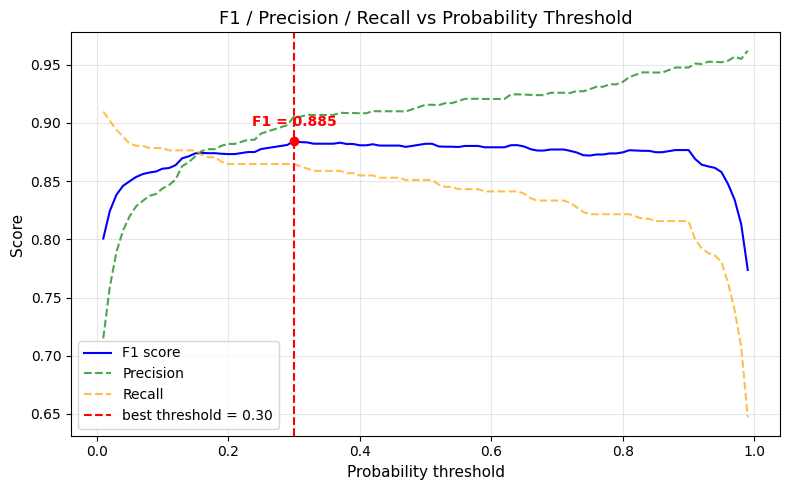

In [107]:
arr, best = f1_by_threshold(y_cls_train, y_proba)
plot_f1(arr, best)

In [108]:
threshold = best['threshold']

Оптимальный порог классификации, максимизируеющий $F1$, близок к 0.5.

### Вывод
С учетом постановки задачи для решения задачи регресси с целевой метрикой $MAE$ в качестве оптимальной модели выбрана нейронная сеть с двумя скрытыми слоями.

Дополнительно исследована модель бинарной классификации (также нейронная сеть с двумя скрытыми слоями), которая позволяет предсказывать вероятность принадлежности к заданному классу - значение в диапазоне от 0 до 1, что соответствует требованию к выходным данным, обозначенным во введении.

## Тестирование оптимальной модели

In [109]:
y_pred = neural_network.predict(X_test)
print(f"MAE на тестовой выборке: {mean_absolute_error(y_pred, y_test):.2f}")

MAE на тестовой выборке: 0.15


Целевая метрика на тестовых данных сопоставима с результатами при кросс-валидиции, что позволяет предположить отсутствие переобучения модели.

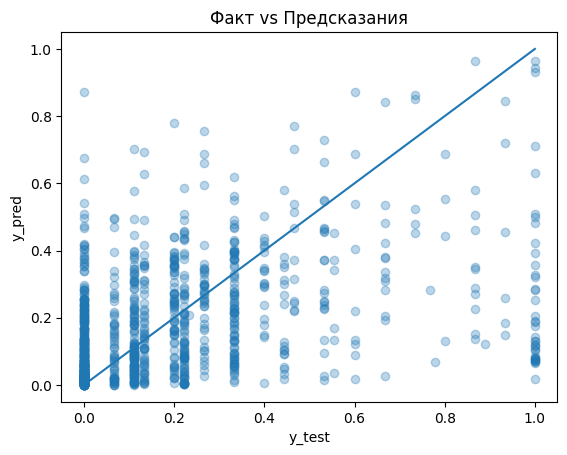

In [110]:
plt.scatter(y_test, y_pred, alpha=0.3)
plt.xlabel('y_test')
plt.ylabel('y_pred')
plt.title('Факт vs Предсказания')
plt.plot([0,1], [0,1])
plt.show()

**Вывод**: При визуальном сравнении фактических значений с предсказаниями можно сделать вывод, что модель относительно хорошо предсказывает низкую степень совпадения изображени и описания (менее 0.4) и крайне плохо предсказывает высокую степень совпадения (около 1), что может быть обусловленно преобладанием несовпадающих описаний и изображений в обучающей выборке.

### Альтарнативная модель - бинарная классификация

In [111]:
y_pred = neural_network_cls.predict(X_test)
y_proba = neural_network_cls.predict_proba(X_test)[:, 1]

In [112]:
print("Матрики на тестовой выборке:")
print(classification_report(y_cls_test, y_pred, digits=3))
print(f"\nROC-AUC: {roc_auc_score(y_cls_test, y_proba):.3f}")

Матрики на тестовой выборке:
              precision    recall  f1-score   support

           0      0.894     0.944     0.918       959
           1      0.500     0.335     0.401       161

    accuracy                          0.856      1120
   macro avg      0.697     0.640     0.660      1120
weighted avg      0.838     0.856     0.844      1120


ROC-AUC: 0.770


Метрики на тестовой выборке сопоставими с метриками, полученными при кросс-валидации, что свидетельствует об отсутствии переобучения модели.

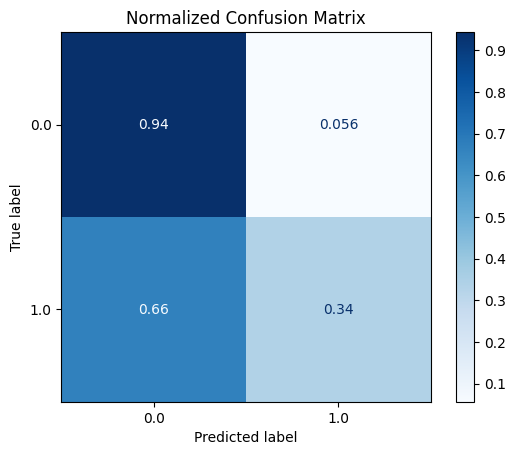

In [113]:
cm = confusion_matrix(y_cls_test, y_pred, normalize="true")
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=neural_network_cls.classes_)
disp.plot(cmap="Blues")
plt.title("Normalized Confusion Matrix")
plt.show()

Модель качественно предсказываает класс 0 и ошибается при предсказании класа 1, что может быть связано со значительным дисбалансом классов в обучающей выборке.

**Изменение порога классификации**

На этапе обучения в качестве оптимального выбран порог классификации 0.48.

In [114]:
y_pred = (y_proba >= threshold).astype(int)

In [115]:
print("Матрики на тестовой выборке:")
print(classification_report(y_cls_test, y_pred, digits=3))
print(f"\nROC-AUC: {roc_auc_score(y_cls_test, y_proba):.3f}")

Матрики на тестовой выборке:
              precision    recall  f1-score   support

           0      0.900     0.921     0.910       959
           1      0.453     0.391     0.420       161

    accuracy                          0.845      1120
   macro avg      0.677     0.656     0.665      1120
weighted avg      0.836     0.845     0.840      1120


ROC-AUC: 0.770


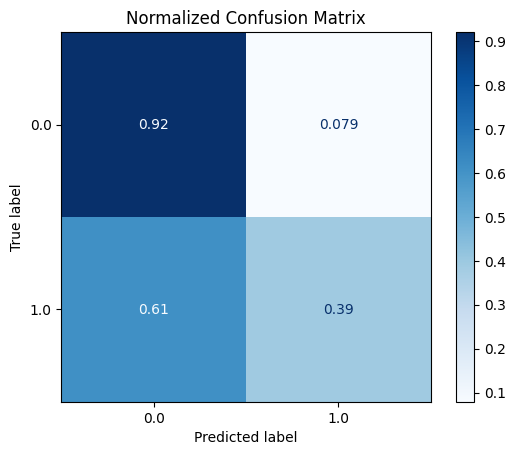

In [116]:
cm = confusion_matrix(y_cls_test, y_pred, normalize="true")
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=neural_network_cls.classes_)
disp.plot(cmap="Blues")
plt.title("Normalized Confusion Matrix")
plt.show()

Изменение порога классификации не оказывает существенного влияния на частоту ошибки второго рода.

### Вывод
Из-за того, что в обучающей выборке преобладают пары изображение-описание, не соответствующие друг другу, исследованные модели позволяют достаточно хорошо предсказывать несовпадающие изображения и описания, но плохо идентифицируют совпадающие, что ограничевает возможность успешной демонстрации поиска изображения по описанию.

## Тестирование поиска изображений по запросу

### Векторизация тестовых изображений

In [117]:
images = df_test['image'].tolist()
batch_size = 32
vectors = []

In [118]:
for i in tqdm(range(0, len(images), batch_size)):
    batch_files = images[i:i + batch_size]
    batch_tensors = []

    for image in batch_files:
        img = Image.open(BASE_PATH + "test_images/" + image).convert("RGB")
        tensor = preprocess(img)
        batch_tensors.append(tensor)

    batch_tensor = torch.stack(batch_tensors).to(device)

    with torch.no_grad():
        output_tensor = resnet(batch_tensor)
        output_tensor = output_tensor.view(output_tensor.size(0), -1)

    batch_np = output_tensor.cpu().numpy()
    vectors.append(batch_np)

100%|██████████| 16/16 [00:03<00:00,  4.31it/s]


In [119]:
test_images = np.concatenate(vectors, axis=0)
test_images.shape

(500, 512)

### Реализация поиска по запросу

Поиск по запросу будет осуществляться следующим образом:
1. Проверка запроса на соответствие юридическому ограничению
2. Векторизация запроса (текста)
3. Объединение векторов всех тестовых изображений с вектором запроса (текста)
4. Предсказание степени соответствия для всех пар изображение-запрос
5. Выбор изображения с максимальной степенью соответствия
6. Вывод отобранного изображения

#### Базовая модель

In [120]:
def search_image(text):

    print(text)
    
    if is_child_caption(text):
        print("This image is unavailable in your country in compliance with local laws" + "\n")
    else:
    
        text = clean_text(text, lower=True)
        
        with torch.no_grad():

            encoded = tokenizer(
                text,
                add_special_tokens=True,
                truncation=True,
                max_length=max_length,
                padding=True,
                return_attention_mask=True,
                return_tensors='pt'
            )

        
            input_ids = encoded["input_ids"].to(device)
            attention_mask = encoded["attention_mask"].to(device)
        
            out = model(input_ids=input_ids, attention_mask=attention_mask)

            current_embeddings = out.last_hidden_state[:, 0, :].detach().cpu().numpy()

        test_features = np.concatenate([test_images,
                                        np.repeat(current_embeddings, test_images.shape[0], axis=0)],
                                       axis=1)

        y_pred = neural_network.predict(test_features)
        index_max = np.argmax(y_pred)

        img = Image.open(BASE_PATH + "test_images/" + df_test.loc[index_max, 'image']).convert("RGB")
        print(f"Прогноз вероятности: {y_pred[index_max][0]:.2f}")
        plt.imshow(img)
        plt.axis("off")
        plt.show()
        print()

#### Альтернативная модель

In [121]:
def search_image_v2(text, threshold, show_mismatched = True):

    print(text)
    
    if is_child_caption(text):
        print("This image is unavailable in your country in compliance with local laws" + "\n")
    else:
    
        text = clean_text(text, lower=True)
        
        with torch.no_grad():

            encoded = tokenizer(
                text,
                add_special_tokens=True,
                truncation=True,
                max_length=max_length,
                padding=True,
                return_attention_mask=True,
                return_tensors='pt'
            )

        
            input_ids = encoded["input_ids"].to(device)
            attention_mask = encoded["attention_mask"].to(device)
        
            out = model(input_ids=input_ids, attention_mask=attention_mask)

            current_embeddings = out.last_hidden_state[:, 0, :].detach().cpu().numpy()

        test_features = np.concatenate([test_images,
                                        np.repeat(current_embeddings, test_images.shape[0], axis=0)],
                                       axis=1)

        y_proba = neural_network_cls.predict_proba(test_features)[:, 1]
        index_max = np.argmax(y_proba)

        if show_mismatched == False and y_proba[index_max][0] < threshold:
            print("No relevant images found." + "\n")
        else:
            img = Image.open(BASE_PATH + "test_images/" + df_test.loc[index_max, 'image']).convert("RGB")
            print(f"Прогноз вероятности: {y_proba[index_max][0]:.2f}")
            print(f"Запрос и изображение соответствуют (предсказание): {y_proba[index_max][0] >= threshold}")
            plt.imshow(img)
            plt.axis("off")
            plt.show()
            print()                        

#### Тестирование

In [122]:
texts_list = df_test.sample(20)['query_text'].tolist()

Test 1
Model 1 (regression)
A young boy jumps his bicycle on a tagged bike ramp .
This image is unavailable in your country in compliance with local laws

Model 2 (classification)
A young boy jumps his bicycle on a tagged bike ramp .
This image is unavailable in your country in compliance with local laws


Test 2
Model 1 (regression)
Two boys in swimsuits standing under running water .
This image is unavailable in your country in compliance with local laws

Model 2 (classification)
Two boys in swimsuits standing under running water .
This image is unavailable in your country in compliance with local laws


Test 3
Model 1 (regression)
Three people , one wearing a t-shirt and baseball cap , are seated on a bus .
Прогноз вероятности: 0.43


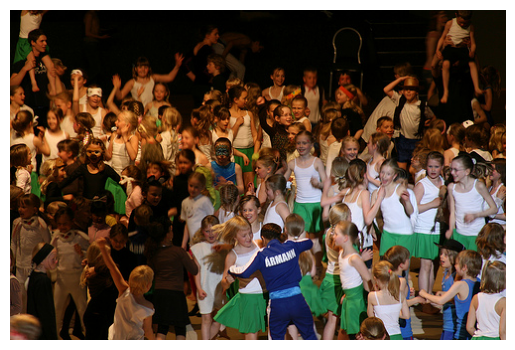


Model 2 (classification)
Three people , one wearing a t-shirt and baseball cap , are seated on a bus .
Прогноз вероятности: 0.01
Запрос и изображение соответствуют (предсказание): False


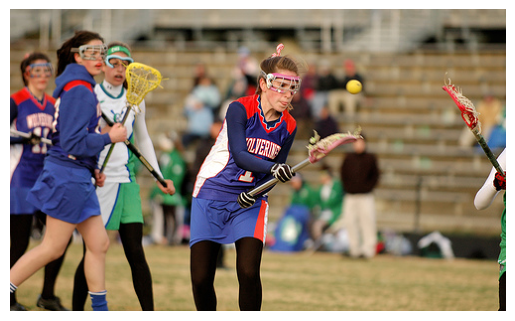



Test 4
Model 1 (regression)
A woman with glasses is sewing .
Прогноз вероятности: 0.26


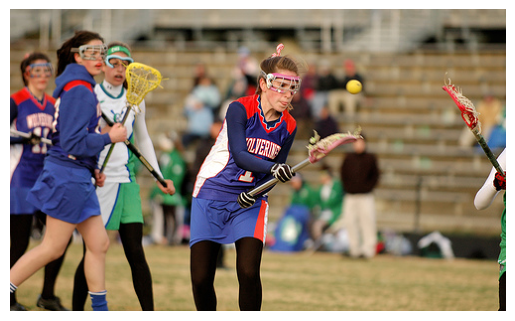


Model 2 (classification)
A woman with glasses is sewing .
Прогноз вероятности: 0.65
Запрос и изображение соответствуют (предсказание): True


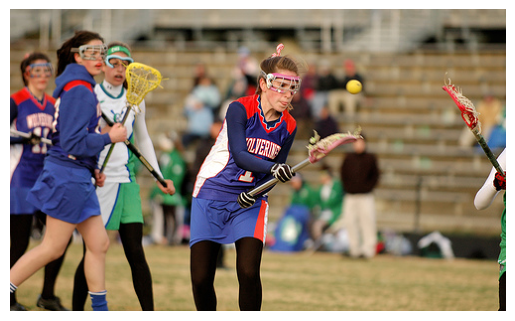



Test 5
Model 1 (regression)
Boy flings mud at girl
This image is unavailable in your country in compliance with local laws

Model 2 (classification)
Boy flings mud at girl
This image is unavailable in your country in compliance with local laws


Test 6
Model 1 (regression)
Three men on mountain bikes go over a sand hill .
Прогноз вероятности: 0.66


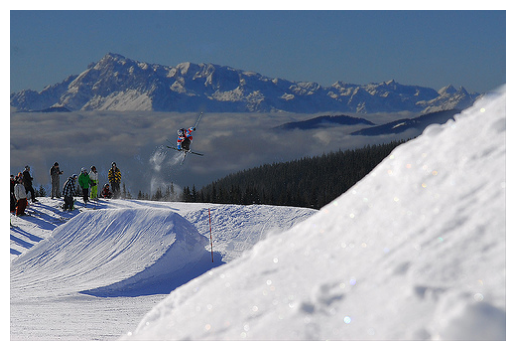


Model 2 (classification)
Three men on mountain bikes go over a sand hill .
Прогноз вероятности: 0.99
Запрос и изображение соответствуют (предсказание): True


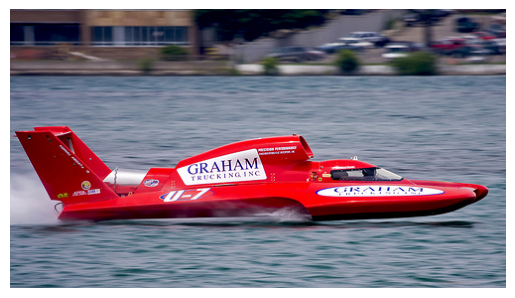



Test 7
Model 1 (regression)
A sad looking dog sitting next to shrubs .
Прогноз вероятности: 0.42


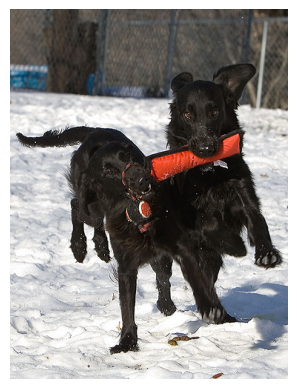


Model 2 (classification)
A sad looking dog sitting next to shrubs .
Прогноз вероятности: 0.58
Запрос и изображение соответствуют (предсказание): True


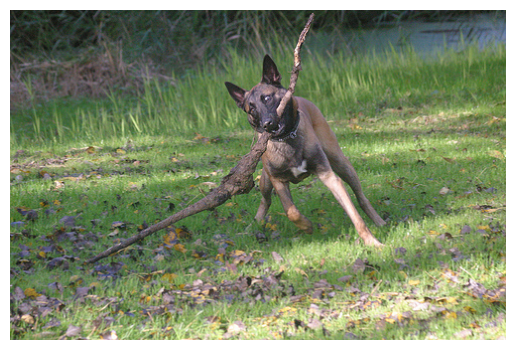



Test 8
Model 1 (regression)
Two puppies jump from a concrete slab onto the grass .
Прогноз вероятности: 0.46


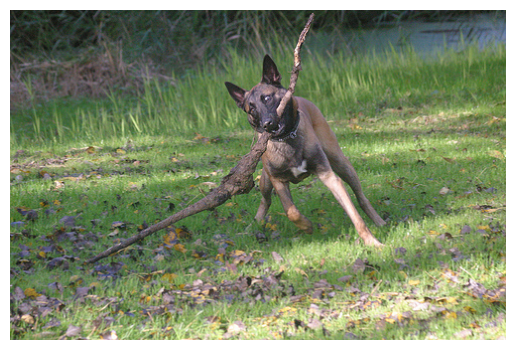


Model 2 (classification)
Two puppies jump from a concrete slab onto the grass .
Прогноз вероятности: 0.77
Запрос и изображение соответствуют (предсказание): True


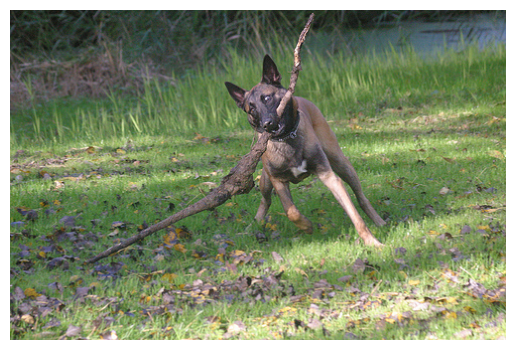



Test 9
Model 1 (regression)
A Yorkie trying to catch a red toy .
Прогноз вероятности: 0.48


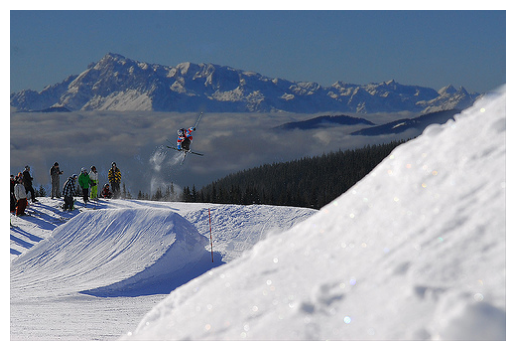


Model 2 (classification)
A Yorkie trying to catch a red toy .
Прогноз вероятности: 0.98
Запрос и изображение соответствуют (предсказание): True


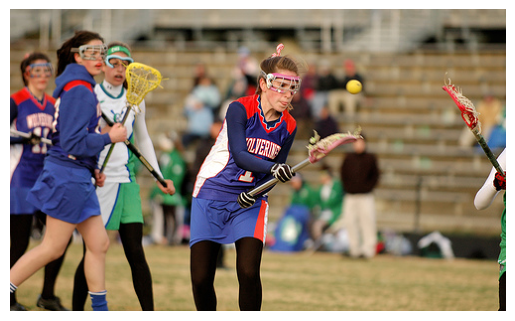



Test 10
Model 1 (regression)
A girl in a bikini top with a great view in the background
Прогноз вероятности: 0.81


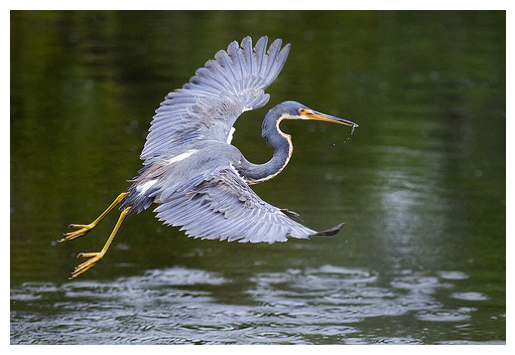


Model 2 (classification)
A girl in a bikini top with a great view in the background
Прогноз вероятности: 1.00
Запрос и изображение соответствуют (предсказание): True


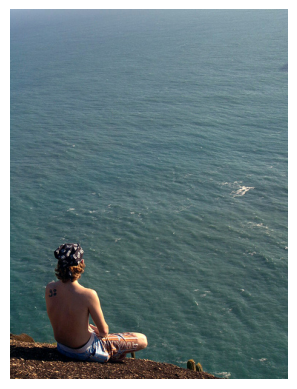



Test 11
Model 1 (regression)
The dog is running .
Прогноз вероятности: 0.70


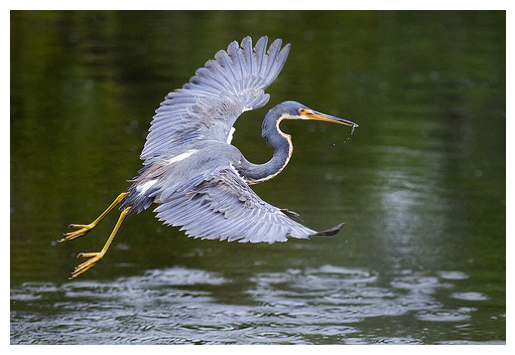


Model 2 (classification)
The dog is running .
Прогноз вероятности: 1.00
Запрос и изображение соответствуют (предсказание): True


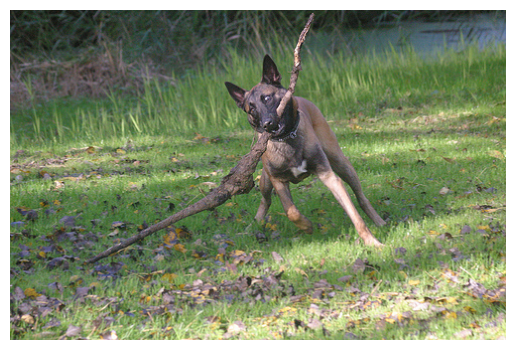



Test 12
Model 1 (regression)
a boy runs through the grass .
This image is unavailable in your country in compliance with local laws

Model 2 (classification)
a boy runs through the grass .
This image is unavailable in your country in compliance with local laws


Test 13
Model 1 (regression)
A little boy in a green soccer uniform is running on the grass .
This image is unavailable in your country in compliance with local laws

Model 2 (classification)
A little boy in a green soccer uniform is running on the grass .
This image is unavailable in your country in compliance with local laws


Test 14
Model 1 (regression)
A white dog runs on brown grass .
Прогноз вероятности: 0.49


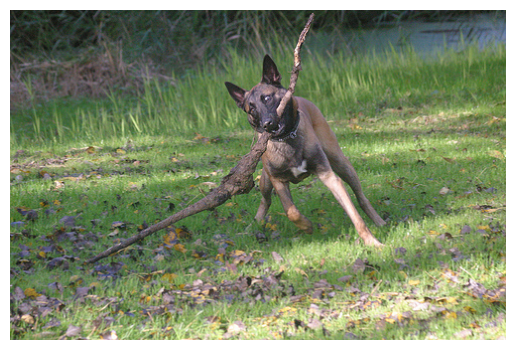


Model 2 (classification)
A white dog runs on brown grass .
Прогноз вероятности: 0.91
Запрос и изображение соответствуют (предсказание): True


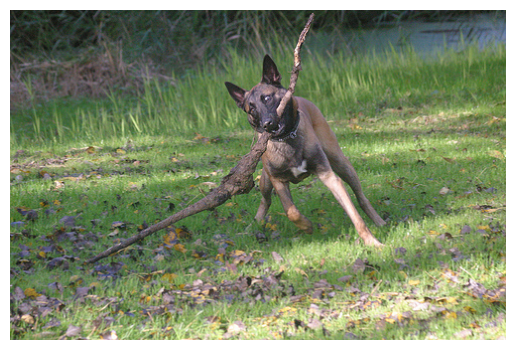



Test 15
Model 1 (regression)
The little girl tackles a man and makes the universal sign for " Touchdown ! "
This image is unavailable in your country in compliance with local laws

Model 2 (classification)
The little girl tackles a man and makes the universal sign for " Touchdown ! "
This image is unavailable in your country in compliance with local laws


Test 16
Model 1 (regression)
a kickboxer jumping for a kick
Прогноз вероятности: 0.41


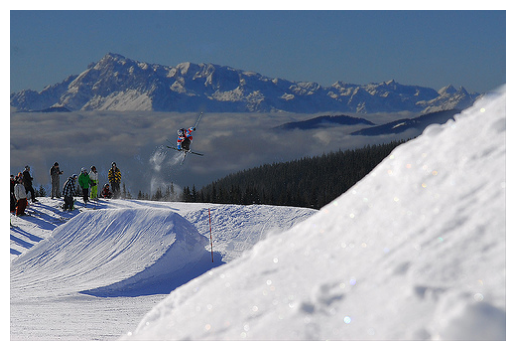


Model 2 (classification)
a kickboxer jumping for a kick
Прогноз вероятности: 0.87
Запрос и изображение соответствуют (предсказание): True


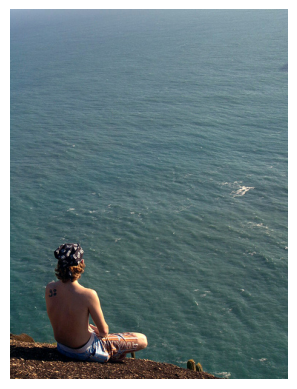



Test 17
Model 1 (regression)
A person with blue hair , a baseball cap , and a hood on stands outdoors in a crowd .
Прогноз вероятности: 0.42


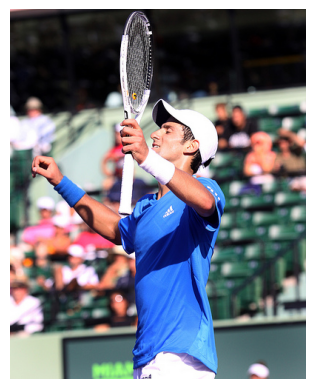


Model 2 (classification)
A person with blue hair , a baseball cap , and a hood on stands outdoors in a crowd .
Прогноз вероятности: 0.00
Запрос и изображение соответствуют (предсказание): False


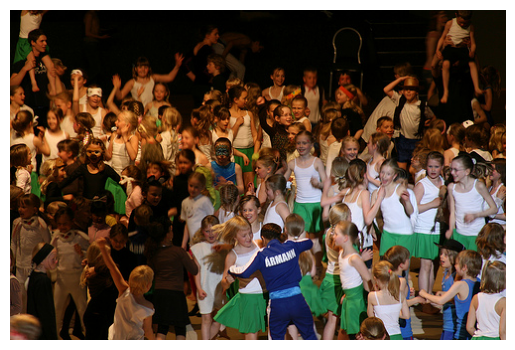



Test 18
Model 1 (regression)
A dog wearing jeans and a shirt stands on the sidewalk .
Прогноз вероятности: 0.48


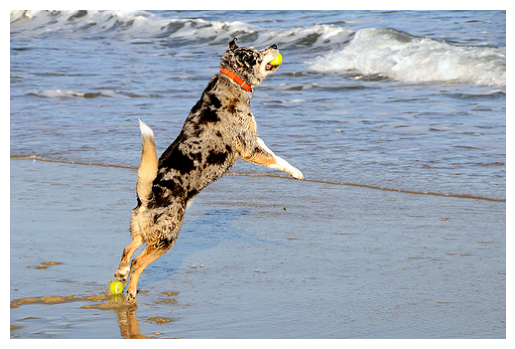


Model 2 (classification)
A dog wearing jeans and a shirt stands on the sidewalk .
Прогноз вероятности: 0.77
Запрос и изображение соответствуют (предсказание): True


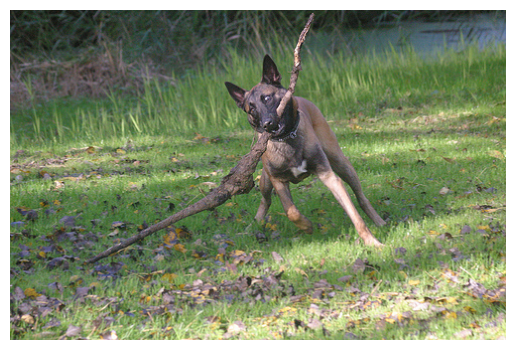



Test 19
Model 1 (regression)
Little kid in blue coat and hat riding a tricycle .
This image is unavailable in your country in compliance with local laws

Model 2 (classification)
Little kid in blue coat and hat riding a tricycle .
This image is unavailable in your country in compliance with local laws


Test 20
Model 1 (regression)
A man who is dressed like a wrestler walks while people take his picture .
Прогноз вероятности: 0.48


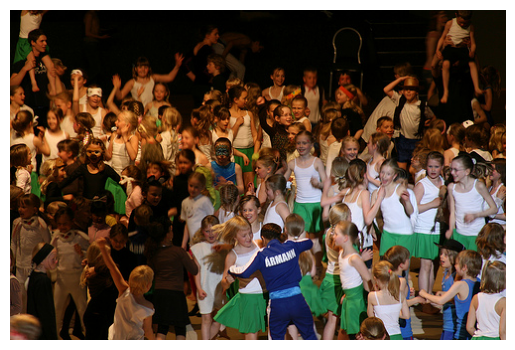


Model 2 (classification)
A man who is dressed like a wrestler walks while people take his picture .
Прогноз вероятности: 0.65
Запрос и изображение соответствуют (предсказание): True


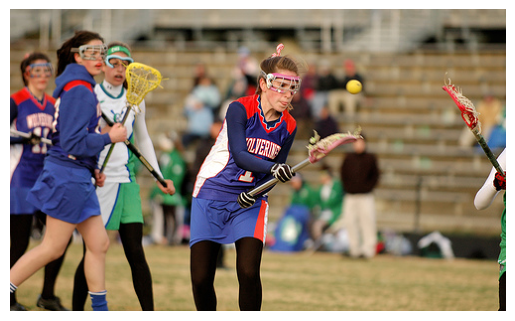

In [123]:
i = 1

for text in texts_list:
    print("Test", i)
    print("Model 1 (regression)")
    search_image(text)
    print("Model 2 (classification)")
    search_image_v2(text, threshold = threshold)
    print()
    i = i + 1

#### Выводы
* Запросы с описанием детей в тексте успешно выявляются и блокируются.
* Выводятся изображения детей в ответ на запросы без упоминания детей. Реализация работы с юридическим ограничением на уровне текста не является достаточной, требуется дополнительная разметка изображений с детьми для точной блокировки.
* Визуально при выборочной проверке альтернативный подход с использованием модели бинарной классификации сопоставим и в некоторых случаях позволяет обеспечить чуть более точный поиск изображения по описанию.

## Общий вывод

Проект реализован с целью **проверки концепции (Proof of Concept)** поиска изображений по коротким описаниям с учетом следующих **требовиний**:
1. Запред на вывод изображений детей до 16 лет (юридическое ограничение)
2. Требования к модели:
    * предсказание должно характеризовать соответствие изобржения и описания (текста) и принимать значение от 0 до 1
    * модели обязательные для вклучения в исследование:
        * линейная регрессия
        * нейронная сеть

В исходных данных было представлено 2 оценки соответствия пар изображение-описание:
* Дискретная экспертная оценка от 1 до 4 (1, 2 - нет соответствия; 3, 4 - есть соответствие). Для каждого изображения представлена оценка от 3 экспертов.
* Краудсорсинговая оценка: доля участников опроса, которые сочли, что изображение и описание соответствуют.

В рамках исследовательского анализа было выявлено:
1. Краудсорсинговая оценка доступна только для 40% изображений в обучающей выборке
2. Для абсолютного большинства пар изображение-описание краудсорсинговая оценка сформирована с учетом мнения 3 человек, что влечет не только низкую точность оценки, но и дискретную природу полученной оценки
3. В обучающей выборке преобладают пары изображение-описание, которые не соответствую друг другу

С учетом вышеуказанных ограничений принято решение исследовать 2 подхода:
1. Модель регресси (с учетом исходных требований по проекту). Целевая переменная: линейная комбинация средней нормализованной оценки экспертов и краудсорсинговой оценки с коэффициентами 0.6 и 0.4 соответственно.
3. Модель бинарной классификации с учетом того, что предсказание вероятности класса может является непрерывной характеристикой соответствия изображения и описания в диапазоне от 0 до 1. Целевая переменная: класс 1 - изображение и описание соответствуют (оценка экспертов 3 или 4 по голосованию большинства); класс 0 - изображение и описание не соответствуют (оценка экспертов 1 или 2 по голосованию большинства). Выявлени значительный дисбаланс классов: класс 1 составляет менее 15% от общего размера обучающей выборки.

Для соблюдения юридического ограничения сформирован список слов и словосочетаний, описывающих детей до 16 лет, выполнена разметка запросов в обучающей выборке. Запросы с упоминаниями детей исключены из исследования.

Для векторизации запросов (текстов) использована модель $BERT$, не учитывающая регистр текстов. Для векторизации изображений использована модель $ResNet18$.

Для решения задачи регрессии рассмотрены следующие модели:
1. ленейная регрессия с регуляризацией
2. неоронная сеть с функцией активации сигмоида на выходе, чтобы обеспечить выходное зачение строго от 0 до 1
3. модель градиентного бустинга

Выбор оптимальной модели осуществлялася с учетом метрики $MAE$, чтобы минимизировать абсолютное отклонение предсказания от фактического значение. В качестве оптимальной модели выбрана нейронная сеть, при этом средняя абсолютная ошибка при кросс-валидации сохраняется на высоком уровне - 0.16 при изменении целевой переменной от 0 до 1. При тестировании модели сравнение предсказаний и фактических значений выявило, что модель может достаточно хорошо предсказывать нессответствие изображени и описания, но плохо предсказывает их соответствие. Такая проблема может возникать из-за преобладания несоответствующих пар изображение-описание в обучающей выборке.

Для обучения модели бинарной классификации использована нейроная сеть (с учетом успешного использования нейронной сети для задачи регрессии). Метрика $ROC-AUC$ достигает 0.79 при кросс-валидации. На обучающей выборке предложен подход к изменению порога классификации, позволяющий повысить качество предсказаний. При тестировании модели выявлена высокая доля ошибок второго рода, которая ограничивает эффективность использования модели для поиска изображений по запросу и обусловленная дисбалансом классов в целево переменной.

Для тестирования возможности поиска изображения по запросу использована функция, которая реализует следующие шаги:
1. Проверка запроса на соответствие юридическому ограничению
2. Векторизация запроса (текста)
3. Объединение векторов всех тестовых изображений с вектором запроса (текста)
4. Предсказание степени соответствия для всех пар изображение-запрос
5. Выбор изображения с максимальной степенью соответствия
6. Вывод отобранного изображения

Ключевая проблема, выявленная при тестировании функции - вывод изображений детей при запросах, в которых не встречается упоминание детей, что является нарушением юридического ограничения, таким образом помимо блокировки на уровне запросов, необходима разметка изображений и блокировка на уровне изображений. На данном этапе поиск изображений не является оффективным из-за большого количества ошибок при предсказании высокого уровня соответствия запроса и изображения.

**Рекомендации для дельнейшей проработки проекта:**
1. Необходима прямая разметка и модель предсказания, что на изображении ребенок, с последующей блокировкой, т.к. фильтрации запросов на уровне упоминания детей в тексте не достаточно для того, чтобы полностью исключить вывод изображений с детьми.
2. Ключевым ограничением для обучения модели является преобладание в обучающей выборке пар изображение-описание, которые не соответствуют друг другу. Для повышения качества предсказаний необходимо обеспечить баланс соответствующих и нессответтсвующих пар изображение-описание.
3. Увеличить количество участников в краудсорсинговой оценке изображений (много больше 3) и обеспечить краудсорсинговую оценку всех пар изображение-описание в обучающей выборке.
4. Продолжить проработку классификационных моделей на базе оценок экспертов.

In [124]:
!pip freeze > requirements.txt